<a href="https://colab.research.google.com/github/as791/Brain-Tumor-Segmentation-BRaTS-18/blob/master/Main_file.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Connecting Google Drive

In [1]:
from google.colab import drive
import os
drive.mount('/content/drive',force_remount=True)
os.chdir('/content/drive/My Drive/Dataset')

Mounted at /content/drive


In [2]:
os.listdir()

['LGG',
 'HGG',
 'survival_data.csv',
 'Model_logs',
 'Training Data',
 'Test Data',
 'Validation Data',
 'Extracted Data',
 'Saved Models ',
 'Miscellaneous ',
 'Model Checkpoints',
 'unet.png',
 'Main_file.ipynb']

#Loading data from mri scans

In [0]:
path1 = './HGG/'
path2 = './LGG/'

In [0]:
!pip install SimpleITK

     |████████████████████████████████| 42.5MB 169kB/s 


In [0]:
import SimpleITK as sitk 
from tqdm import tqdm
import numpy as np

In [0]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    flair = sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])
    seg =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[2])    
    t1 =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[3])
    t1ce =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[4])
    t2 =  sitk.GetArrayFromImage(img_itk)
    data.append([flair,t1,t1ce,t2])
    gt.append(seg)
  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)
  return data,gt

In [0]:
# for HGG
data1,gt1 = load_data(path1)   #dividing HGG in three parts i.e. 210 into three sets of 70 
# for LGG
# data2,gt2 = load_data(path2)  #LGG having 75 patients 

100%|██████████| 75/75 [03:53<00:00,  2.78s/it]


In [0]:
# data2.shape,gt2.shape,data2.dtype,gt2.dtype

((75, 4, 155, 240, 240), (75, 155, 240, 240), dtype('int16'), dtype('int16'))

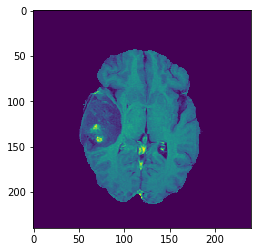

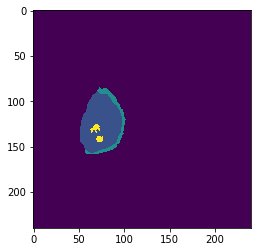

In [0]:
# import matplotlib.pyplot as plt
# plt.imshow(data2[45,2,65,:,:])
# plt.show()
# plt.imshow(gt2[45,65,:,:])
# plt.show()

In [0]:
# np.save('data2.npy',data2)
# np.save('gt2.npy',gt2)

#Loading saved data for usage

In [0]:
import numpy as np
from tqdm import tqdm

In [0]:
data = np.load('./Extracted Data/data2.npy')
gt = np.load('./Extracted Data/gt2.npy')

In [0]:
data = np.transpose(data,(0,2,3,4,1))

In [0]:
data.shape,gt.shape,data.dtype,gt.dtype

((75, 155, 240, 240, 4), (75, 155, 240, 240), dtype('int16'), dtype('int16'))

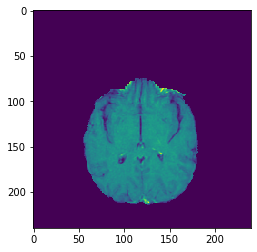

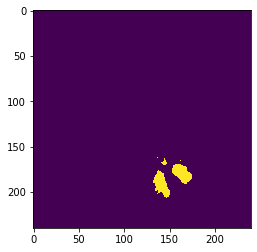

In [0]:
import matplotlib.pyplot as plt
plt.imshow(data[50,70,:,:,2])
plt.show()
plt.imshow(gt[50,70,:,:])
plt.show()

# Pre-Processing of data 

In [0]:
data.shape,gt.shape

((75, 155, 240, 240, 4), (75, 155, 240, 240))

In [0]:
'''Taking Only from 30th slice till 120th slice for creating the data and also cropping the images to discard useless background 
So, from 240x240x4 each image now becomes of shape 192x192x4 taking all 4 modalities''' 

In [0]:
data = data[:,30:120,30:222,30:222,:].reshape([-1,192,192,4])
gt = gt[:,30:120,30:222,30:222].reshape([-1,192,192,1])

In [0]:
data.shape,gt.shape

((6750, 192, 192, 4), (6750, 192, 192, 1))

In [0]:
gt[np.where(gt==4)]=3   #converting ground truth value of 4 to 3 to do one hot encoding (Consider value 3 in results in output as class 4)

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(data, gt, test_size=0.20, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25,random_state=42)

In [0]:
%tensorflow_version 1.x

In [0]:
from keras.utils import to_categorical,normalize
Y_train = to_categorical(Y_train)
Y_val = to_categorical(Y_val)
X_train = (X_train-np.mean(X_train))/np.max(X_train)
X_test = (X_test-np.mean(X_test))/np.max(X_test)
X_val = (X_val-np.mean(X_val))/np.max(X_val)

Using TensorFlow backend.


In [0]:
X_train.shape,Y_train.shape, X_val.shape, Y_val.shape, X_test.shape, Y_test.shape

((4050, 192, 192, 4),
 (4050, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 1))

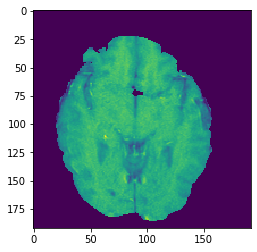

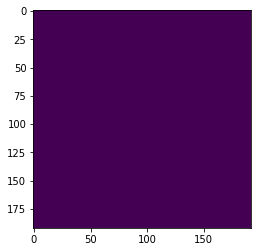

In [0]:
plt.imshow(X_train[1,:,:,1])
plt.show()
plt.imshow(Y_train[1,:,:,3])
plt.show()

In [0]:
#Saving the data one by one total set 4
np.save('./Training Data/X_train4.npy',X_train)
np.save('./Training Data/Y_train4.npy',Y_train)
np.save('./Validation Data/X_val4.npy',X_val)
np.save('./Validation Data/Y_val4.npy',Y_val)
np.save('./Test Data/X_test4.npy',X_test)
np.save('./Test Data/Y_test4.npy',Y_test)

# U-net + dice loss 

## Loading Data

In [0]:
'''Using 4 sets made by pre-processing one by one each having training set of 3780, validaiton of 1260 and test data of 1260 slices of mri scans'''

'Using 4 sets made by pre-processing one by one each having training set of 3780, validaiton of 1260 and test data of 1260 slices of mri scans'

In [0]:
import numpy as np

In [0]:
# X_train = np.load('./Training Data/X_train1.npy')
# Y_train = np.load('./Training Data/Y_train1.npy')
# X_train = np.load('./Training Data/X_train2.npy')
# Y_train = np.load('./Training Data/Y_train2.npy')
# X_train = np.load('./Training Data/X_train3.npy')
# Y_train = np.load('./Training Data/Y_train3.npy')
X_train = np.load('./Training Data/X_train4.npy')
Y_train = np.load('./Training Data/Y_train4.npy')

In [0]:
# X_val = np.load('./Validation Data/X_val1.npy')
# Y_val = np.load('./Validation Data/Y_val1.npy')
# X_val = np.load('./Validation Data/X_val2.npy')
# Y_val = np.load('./Validation Data/Y_val2.npy')
# X_val = np.load('./Validation Data/X_val3.npy')
# Y_val = np.load('./Validation Data/Y_val3.npy')
X_val = np.load('./Validation Data/X_val4.npy')
Y_val = np.load('./Validation Data/Y_val4.npy')

In [6]:
X_train.shape,Y_train.shape,X_val.shape,Y_val.shape

((4050, 192, 192, 4),
 (4050, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 4))

In [3]:
 %tensorflow_version 1.x
from keras.models import Model
from keras.layers import MaxPooling2D,Conv2D,Dense,BatchNormalization,concatenate,Input,Dropout,Maximum,Activation,Dense,Flatten,UpSampling2D,Conv2DTranspose
from keras.optimizers import SGD,Adam,RMSprop
import keras.callbacks as callbacks
import keras.initializers as initializers
from keras.callbacks import Callback
from keras import regularizers

Using TensorFlow backend.


In [4]:
############################################ U-net #############################################

############ Encoder #############
input_ = Input(shape=(192,192,4),name='input')                                              

block1_conv1 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv1')(input_)
block1_conv2 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv2')(block1_conv1)
block1_norm = BatchNormalization(name='block1_batch_norm')(block1_conv2)
block1_pool = MaxPooling2D(name='block1_pool')(block1_norm)

block2_conv1 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv1')(block1_pool)
block2_conv2 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv2')(block2_conv1)
block2_norm = BatchNormalization(name='block2_batch_norm')(block2_conv2)
block2_pool = MaxPooling2D(name='block2_pool')(block2_norm)

encoder_dropout_1 = Dropout(0.2,name='encoder_dropout_1')(block2_pool)

block3_conv1 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv1')(encoder_dropout_1)
block3_conv2 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv2')(block3_conv1)
block3_norm = BatchNormalization(name='block3_batch_norm')(block3_conv2)
block3_pool = MaxPooling2D(name='block3_pool')(block3_norm)

block4_conv1 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv1')(block3_pool)
block4_conv2 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv2')(block4_conv1)
block4_norm = BatchNormalization(name='block4_batch_norm')(block4_conv2)
block4_pool = MaxPooling2D(name='block4_pool')(block4_norm)
################### Encoder end ######################

block5_conv1 = Conv2D(1024,3,padding='same',activation='relu',name='block5_conv1')(block4_pool)
# encoder_dropout_2 = Dropout(0.2,name='encoder_dropout_2')(block5_conv1)

########### Decoder ################

up_pool1 = Conv2DTranspose(1024,3,strides = (2, 2),padding='same',activation='relu',name='up_pool1')(block5_conv1)
merged_block1 = concatenate([block4_norm,up_pool1],name='merged_block1')
decod_block1_conv1 = Conv2D(512,3, padding = 'same', activation='relu',name='decod_block1_conv1')(merged_block1)

up_pool2 = Conv2DTranspose(512,3,strides = (2, 2),padding='same',activation='relu',name='up_pool2')(decod_block1_conv1)
merged_block2 = concatenate([block3_norm,up_pool2],name='merged_block2')
decod_block2_conv1 = Conv2D(256,3,padding = 'same',activation='relu',name='decod_block2_conv1')(merged_block2)

decoder_dropout_1 = Dropout(0.2,name='decoder_dropout_1')(decod_block2_conv1)

up_pool3 = Conv2DTranspose(256,3,strides = (2, 2),padding='same',activation='relu',name='up_pool3')(decoder_dropout_1)
merged_block3 = concatenate([block2_norm,up_pool3],name='merged_block3')
decod_block3_conv1 = Conv2D(128,3,padding = 'same',activation='relu',name='decod_block3_conv1')(merged_block3)

up_pool4 = Conv2DTranspose(128,3,strides = (2, 2),padding='same',activation='relu',name='up_pool4')(decod_block3_conv1)
merged_block4 = concatenate([block1_norm,up_pool4],name='merged_block4')
decod_block4_conv1 = Conv2D(64,3,padding = 'same',activation='relu',name='decod_block4_conv1')(merged_block4)
############ Decoder End ######################################

# decoder_dropout_2 = Dropout(0.2,name='decoder_dropout_2')(decod_block4_conv1)

pre_output = Conv2D(64,1,padding = 'same',activation='relu',name='pre_output')(decod_block4_conv1)

output = Conv2D(4,1,padding='same',activation='softmax',name='output')(pre_output)

model = Model(inputs = input_, outputs = output)
model.summary()













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              (None, 192, 192, 4)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 192, 192, 64) 2368        input[0][0]                      
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 192, 192, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_batch_norm (BatchNormali (None, 192, 192, 64) 256        

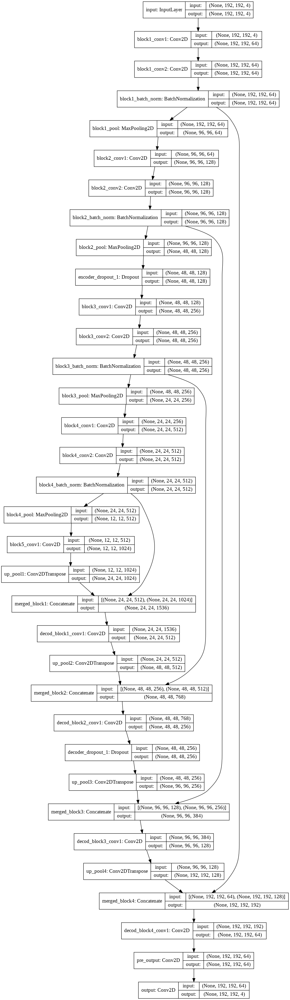

In [0]:
from keras.utils import  plot_model
plot_model(model,to_file='unet.png',show_shapes=True)

## Useless for Now

In [0]:
# class LRFinder(Callback):    
#     '''
#     A simple callback for finding the optimal learning rate range for your model + dataset. 
    
#     # Usage
#         ```python
#             lr_finder = LRFinder(min_lr=1e-5, 
#                                  max_lr=1e-2, 
#                                  steps_per_epoch=np.ceil(epoch_size/batch_size), 
#                                  epochs=3)
#             model.fit(X_train, Y_train, callbacks=[lr_finder])
            
#             lr_finder.plot_loss()
#         ```
    
#     # Arguments
#         min_lr: The lower bound of the learning rate range for the experiment.
#         max_lr: The upper bound of the learning rate range for the experiment.
#         steps_per_epoch: Number of mini-batches in the dataset. Calculated as `np.ceil(epoch_size/batch_size)`. 
#         epochs: Number of epochs to run experiment. Usually between 2 and 4 epochs is sufficient. 
        
#     # References
#         Blog post: jeremyjordan.me/nn-learning-rate
#         Original paper: https://arxiv.org/abs/1506.01186

#     '''
    
#     def __init__(self, min_lr=1e-6, max_lr=1e-2, steps_per_epoch=90, epochs=3):
#         super().__init__()
        
#         self.min_lr = min_lr
#         self.max_lr = max_lr
#         self.total_iterations = steps_per_epoch * epochs
#         self.iteration = 0
#         self.history = {}
        
#     def clr(self):
#         '''Calculate the learning rate.'''
#         x = self.iteration / self.total_iterations 
#         return self.min_lr + (self.max_lr-self.min_lr) * x
        
#     def on_train_begin(self, logs=None):
#         '''Initialize the learning rate to the minimum value at the start of training.'''
#         logs = logs or {}
#         K.set_value(self.model.optimizer.lr, self.min_lr)
        
#     def on_batch_end(self, epoch, logs=None):
#         '''Record previous batch statistics and update the learning rate.'''
#         logs = logs or {}
#         self.iteration += 1

#         self.history.setdefault('lr', []).append(K.get_value(self.model.optimizer.lr))
#         self.history.setdefault('iterations', []).append(self.iteration)

#         for k, v in logs.items():
#             self.history.setdefault(k, []).append(v)
            
#         K.set_value(self.model.optimizer.lr, self.clr())
 
#     def plot_lr(self):
#         '''Helper function to quickly inspect the learning rate schedule.'''
#         plt.plot(self.history['iterations'], self.history['lr'])
#         plt.yscale('log')
#         plt.xlabel('Iteration')
#         plt.ylabel('Learning rate')
#         plt.show()
        
#     def plot_loss(self):
#         '''Helper function to quickly observe the learning rate experiment results.'''
#         plt.plot(self.history['lr'], self.history['loss'])
#         plt.xscale('log')
#         plt.xlabel('Learning rate')
#         plt.ylabel('Loss')
#         plt.show()

In [0]:
# from keras.preprocessing.image import ImageDataGenerator
# datagen = ImageDataGenerator(rotation_range = 20, zoom_range = 0.2, width_shift_range = 0.2, height_shift_range = 0.2)
# datagen.fit(X_train)

In [0]:
# from keras.callbacks import LearningRateScheduler

# def step_decay_schedule(initial_lr=1e-4, decay_factor=0.75, step_size=10):
#     '''
#     Wrapper function to create a LearningRateScheduler with step decay schedule.
#     '''
#     def schedule(epoch):
#         return initial_lr * (decay_factor ** np.floor(epoch/step_size))
    
#     return LearningRateScheduler(schedule)

# lr_sched = step_decay_schedule(initial_lr=1e-4, decay_factor=0.75, step_size=2)


In [0]:
# from keras.callbacks import *

# class CyclicLR(Callback):
#     """This callback implements a cyclical learning rate policy (CLR).
#     The method cycles the learning rate between two boundaries with
#     some constant frequency, as detailed in this paper (https://arxiv.org/abs/1506.01186).
#     The amplitude of the cycle can be scaled on a per-iteration or 
#     per-cycle basis.
#     This class has three built-in policies, as put forth in the paper.
#     "triangular":
#         A basic triangular cycle w/ no amplitude scaling.
#     "triangular2":
#         A basic triangular cycle that scales initial amplitude by half each cycle.
#     "exp_range":
#         A cycle that scales initial amplitude by gamma**(cycle iterations) at each 
#         cycle iteration.
#     For more detail, please see paper.
    
#     # Example
#         ```python
#             clr = CyclicLR(base_lr=0.001, max_lr=0.006,
#                                 step_size=2000., mode='triangular')
#             model.fit(X_train, Y_train, callbacks=[clr])
#         ```
    
#     Class also supports custom scaling functions:
#         ```python
#             clr_fn = lambda x: 0.5*(1+np.sin(x*np.pi/2.))
#             clr = CyclicLR(base_lr=0.001, max_lr=0.006,
#                                 step_size=2000., scale_fn=clr_fn,
#                                 scale_mode='cycle')
#             model.fit(X_train, Y_train, callbacks=[clr])
#         ```    
#     # Arguments
#         base_lr: initial learning rate which is the
#             lower boundary in the cycle.
#         max_lr: upper boundary in the cycle. Functionally,
#             it defines the cycle amplitude (max_lr - base_lr).
#             The lr at any cycle is the sum of base_lr
#             and some scaling of the amplitude; therefore 
#             max_lr may not actually be reached depending on
#             scaling function.
#         step_size: number of training iterations per
#             half cycle. Authors suggest setting step_size
#             2-8 x training iterations in epoch.
#         mode: one of {triangular, triangular2, exp_range}.
#             Default 'triangular'.
#             Values correspond to policies detailed above.
#             If scale_fn is not None, this argument is ignored.
#         gamma: constant in 'exp_range' scaling function:
#             gamma**(cycle iterations)
#         scale_fn: Custom scaling policy defined by a single
#             argument lambda function, where 
#             0 <= scale_fn(x) <= 1 for all x >= 0.
#             mode paramater is ignored 
#         scale_mode: {'cycle', 'iterations'}.
#             Defines whether scale_fn is evaluated on 
#             cycle number or cycle iterations (training
#             iterations since start of cycle). Default is 'cycle'.
#     """

#     def __init__(self, base_lr=0.001, max_lr=0.006, step_size=2000., mode='triangular',
#                  gamma=1., scale_fn=None, scale_mode='cycle'):
#         super(CyclicLR, self).__init__()

#         self.base_lr = base_lr
#         self.max_lr = max_lr
#         self.step_size = step_size
#         self.mode = mode
#         self.gamma = gamma
#         if scale_fn == None:
#             if self.mode == 'triangular':
#                 self.scale_fn = lambda x: 1.
#                 self.scale_mode = 'cycle'
#             elif self.mode == 'triangular2':
#                 self.scale_fn = lambda x: 1/(2.**(x-1))
#                 self.scale_mode = 'cycle'
#             elif self.mode == 'exp_range':
#                 self.scale_fn = lambda x: gamma**(x)
#                 self.scale_mode = 'iterations'
#         else:
#             self.scale_fn = scale_fn
#             self.scale_mode = scale_mode
#         self.clr_iterations = 0.
#         self.trn_iterations = 0.
#         self.history = {}

#         self._reset()

#     def _reset(self, new_base_lr=None, new_max_lr=None,
#                new_step_size=None):
#         """Resets cycle iterations.
#         Optional boundary/step size adjustment.
#         """
#         if new_base_lr != None:
#             self.base_lr = new_base_lr
#         if new_max_lr != None:
#             self.max_lr = new_max_lr
#         if new_step_size != None:
#             self.step_size = new_step_size
#         self.clr_iterations = 0.
        
#     def clr(self):
#         cycle = np.floor(1+self.clr_iterations/(2*self.step_size))
#         x = np.abs(self.clr_iterations/self.step_size - 2*cycle + 1)
#         if self.scale_mode == 'cycle':
#             return self.base_lr + (self.max_lr-self.base_lr)*np.maximum(0, (1-x))*self.scale_fn(cycle)
#         else:
#             return self.base_lr + (self.max_lr-self.base_lr)*np.maximum(0, (1-x))*self.scale_fn(self.clr_iterations)
        
#     def on_train_begin(self, logs={}):
#         logs = logs or {}

#         if self.clr_iterations == 0:
#             K.set_value(self.model.optimizer.lr, self.base_lr)
#         else:
#             K.set_value(self.model.optimizer.lr, self.clr())        
            
#     def on_batch_end(self, epoch, logs=None):
        
#         logs = logs or {}
#         self.trn_iterations += 1
#         self.clr_iterations += 1

#         self.history.setdefault('lr', []).append(K.get_value(self.model.optimizer.lr))
#         self.history.setdefault('iterations', []).append(self.trn_iterations)

#         for k, v in logs.items():
#             self.history.setdefault(k, []).append(v)
        
#         K.set_value(self.model.optimizer.lr, self.clr())


In [0]:
#  clr = CyclicLR(base_lr=1e-5, max_lr=1e-4,step_size=4, mode='triangular')

##Working Area

In [0]:
from keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [10]:
model.compile(optimizer=Adam(lr=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
model.load_weights('./Model Checkpoints/weights.hdf5')
checkpointer = callbacks.ModelCheckpoint(filepath = './Model Checkpoints/weights.hdf5',save_best_only=True)
training_log = callbacks.TensorBoard(log_dir='./Model_logs')

In [11]:
history = model.fit(X_train,Y_train,validation_data=(X_val,Y_val),batch_size=32,epochs=16,callbacks=[training_log,checkpointer],shuffle=True)



Train on 4050 samples, validate on 1350 samples


Epoch 1/16
4050/4050 [==============================] - 106s 26ms/step - loss: 0.0115 - dice_coef: 0.9885 - val_loss: 0.0086 - val_dice_coef: 0.9914

Epoch 2/16
4050/4050 [==============================] - 91s 23ms/step - loss: 0.0076 - dice_coef: 0.9924 - val_loss: 0.0073 - val_dice_coef: 0.9927
Epoch 3/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0069 - dice_coef: 0.9931 - val_loss: 0.0067 - val_dice_coef: 0.9933
Epoch 4/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0065 - dice_coef: 0.9935 - val_loss: 0.0064 - val_dice_coef: 0.9936
Epoch 5/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0063 - dice_coef: 0.9937 - val_loss: 0.0063 - val_dice_coef: 0.9937
Epoch 6/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0060 - dice_coef: 0.9940 - val_loss: 0.0062 - val_dice_coef: 0.9938
Epoch 7/16
4050/4050 [==============================] - 91

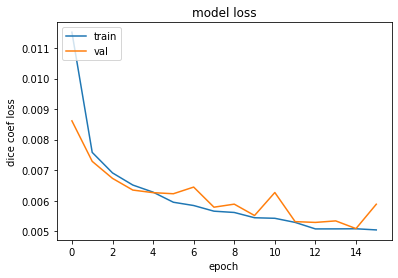

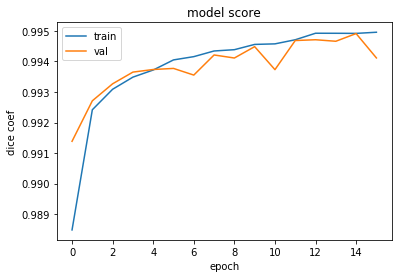

In [12]:
# summarize history for loss
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [0]:
# X_test = np.load('./Test Data/X_test1.npy')
# Y_test = np.load('./Test Data/Y_test1.npy')
# X_test = np.load('./Test Data/X_test2.npy')
# Y_test = np.load('./Test Data/Y_test2.npy')
# X_test = np.load('./Test Data/X_test3.npy')
# Y_test = np.load('./Test Data/Y_test3.npy')
X_test = np.load('./Test Data/X_test4.npy')
Y_test = np.load('./Test Data/Y_test4.npy')

In [0]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [15]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [16]:
Y_pre.shape

(1350, 192, 192)

In [0]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [18]:
Y_test.shape,X_test.shape

((1350, 192, 192, 1), (1350, 192, 192, 4))

X_test 450


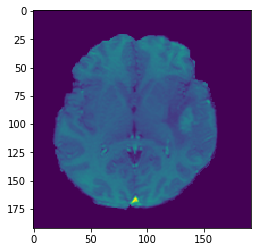

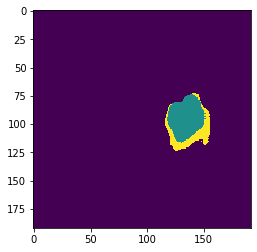

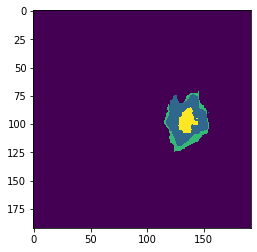

X_test 451


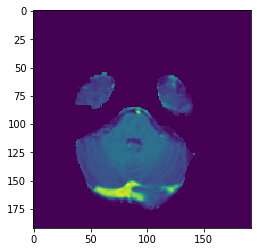

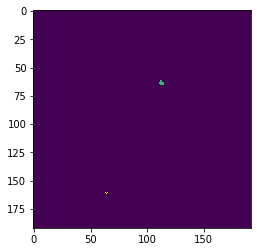

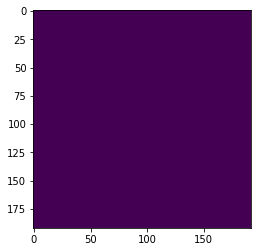

X_test 452


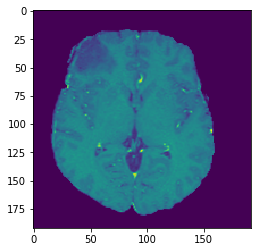

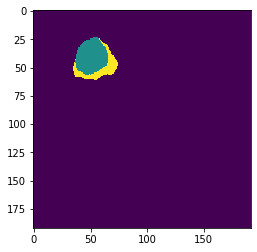

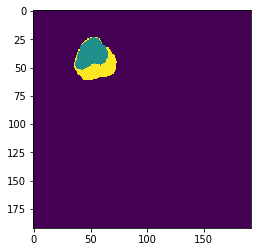

X_test 453


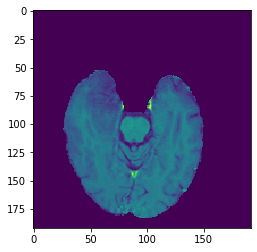

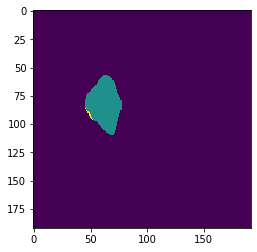

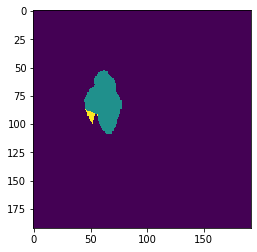

X_test 454


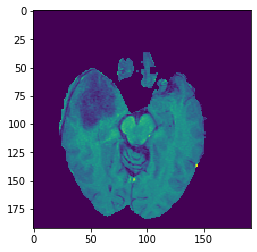

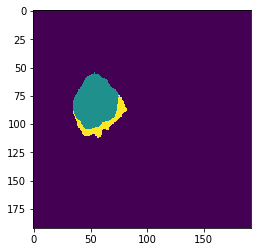

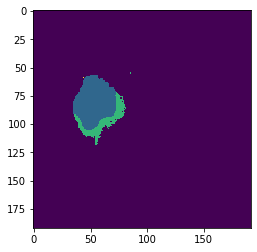

X_test 455


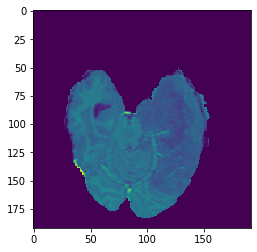

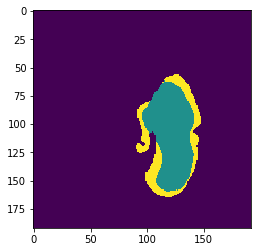

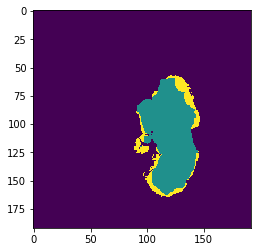

X_test 456


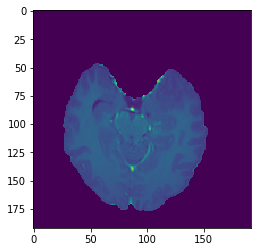

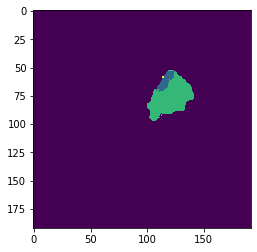

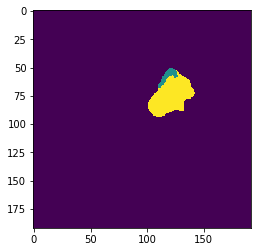

X_test 457


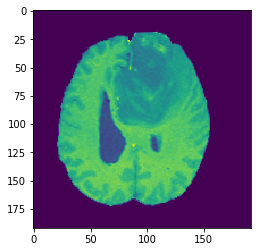

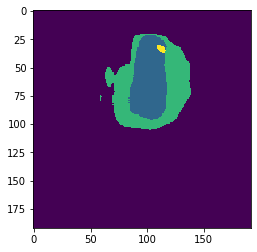

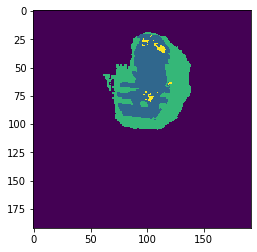

X_test 458


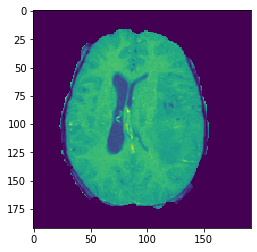

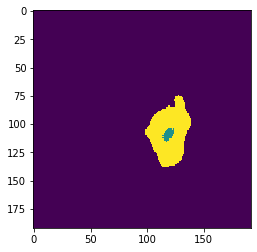

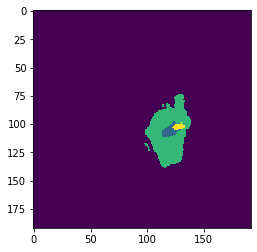

X_test 459


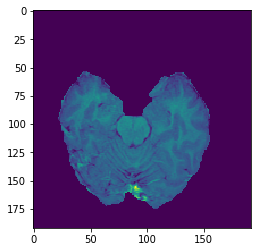

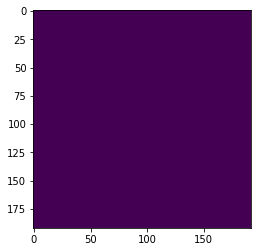

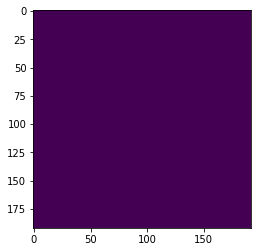

X_test 460


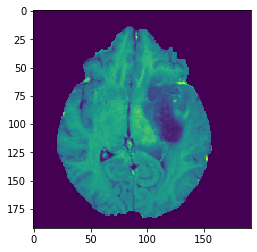

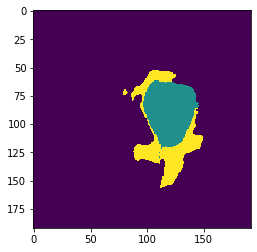

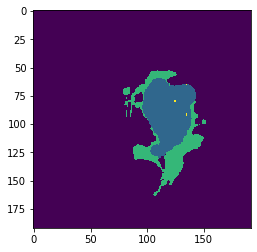

X_test 461


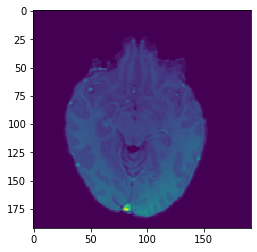

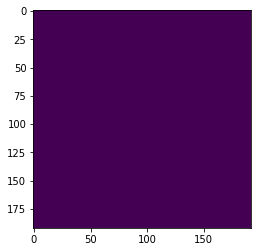

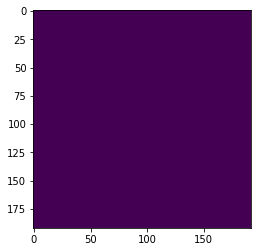

X_test 462


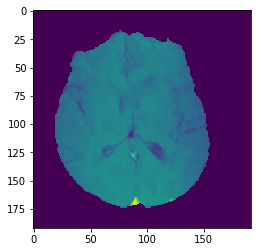

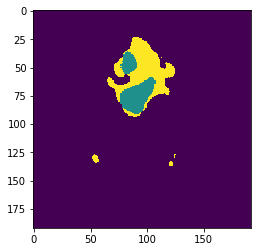

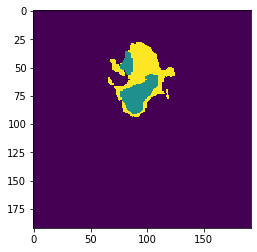

X_test 463


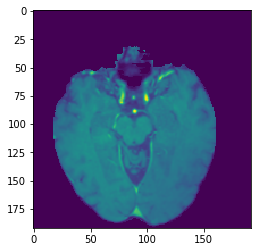

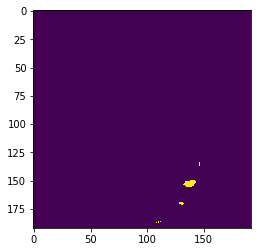

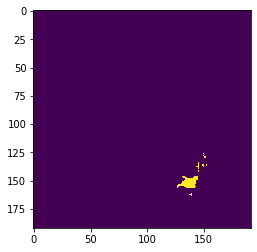

X_test 464


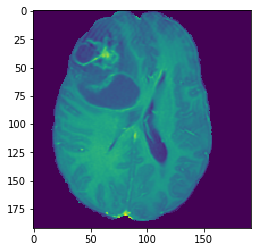

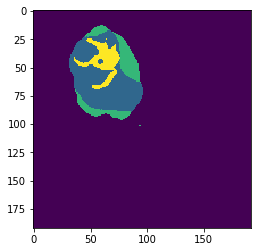

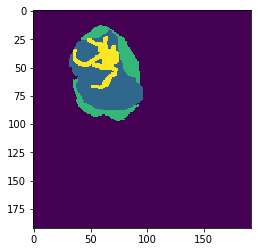

X_test 465


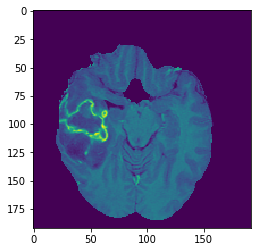

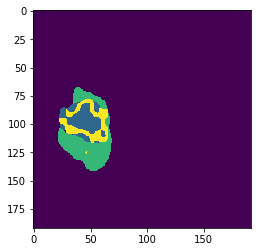

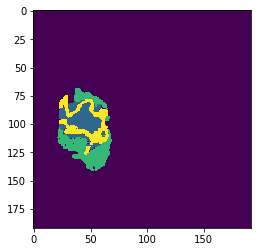

X_test 466


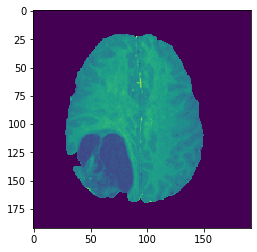

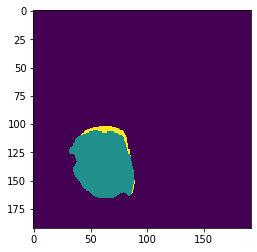

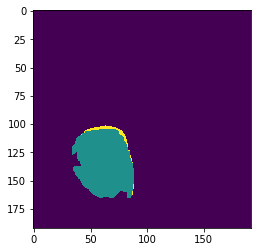

X_test 467


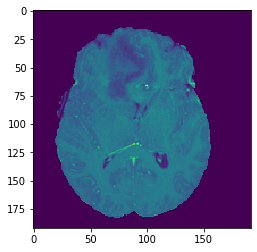

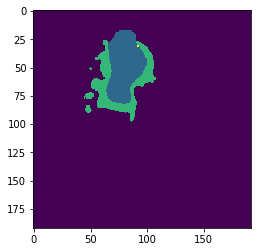

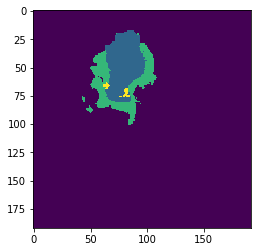

X_test 468


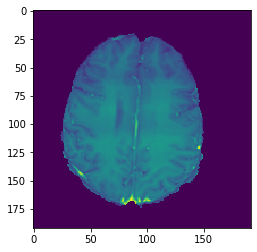

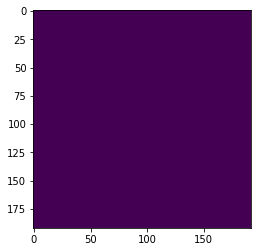

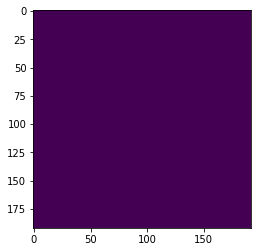

X_test 469


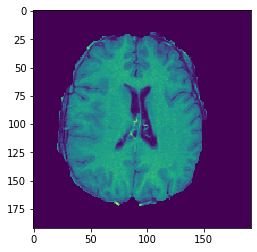

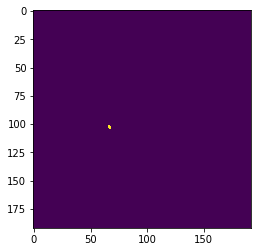

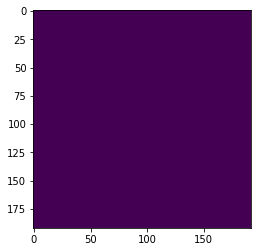

X_test 470


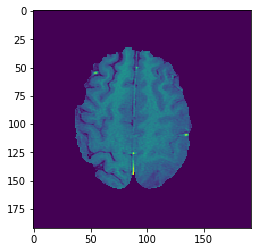

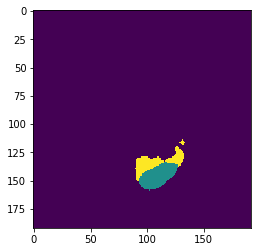

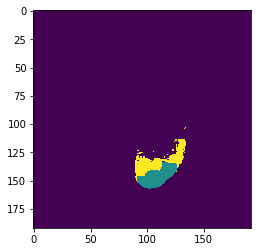

X_test 471


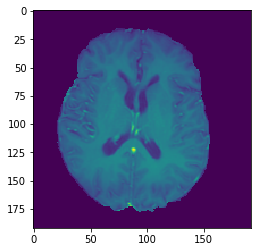

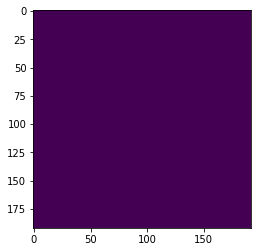

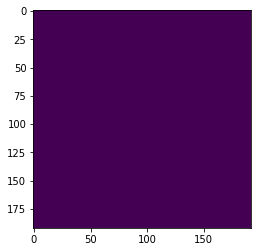

X_test 472


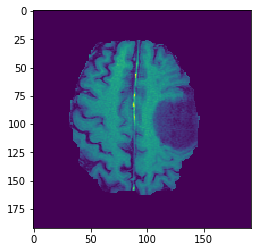

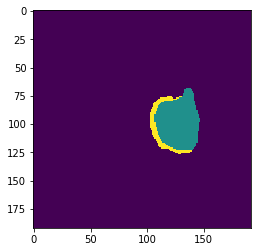

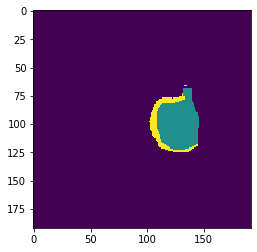

X_test 473


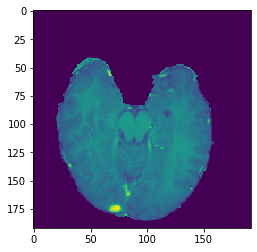

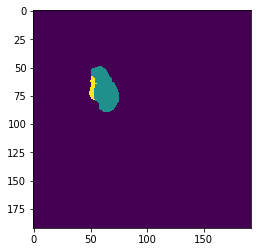

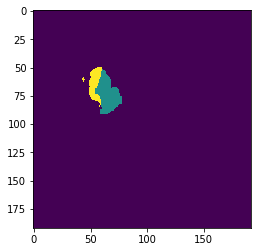

X_test 474


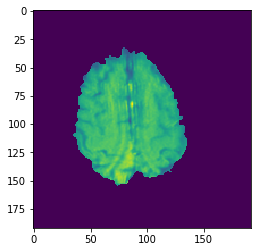

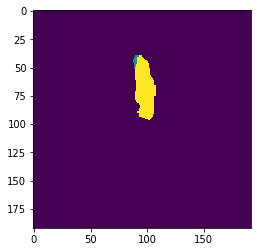

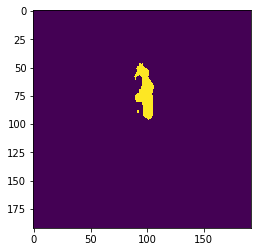

X_test 475


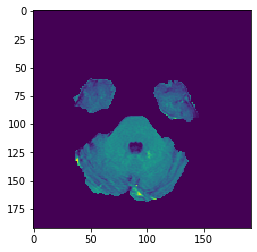

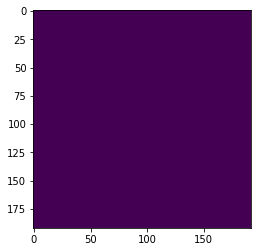

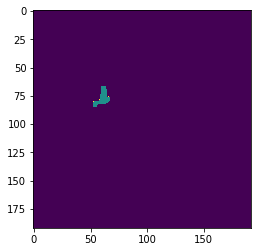

X_test 476


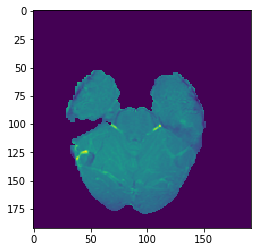

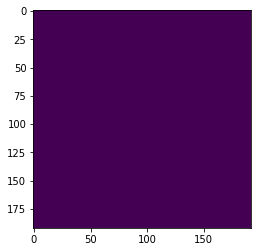

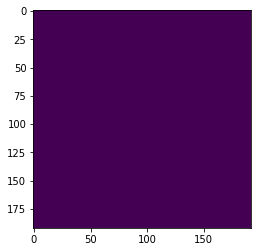

X_test 477


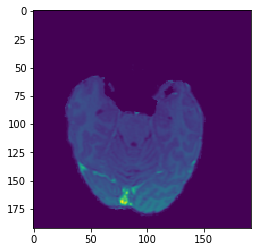

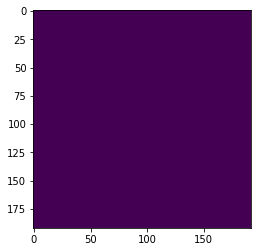

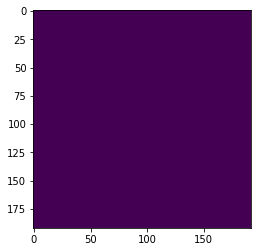

X_test 478


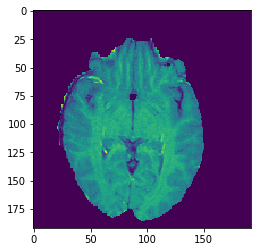

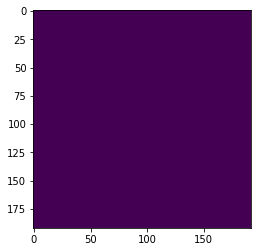

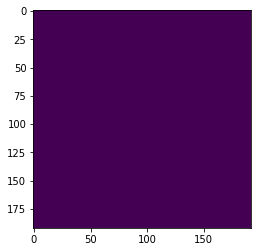

X_test 479


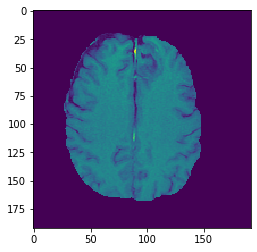

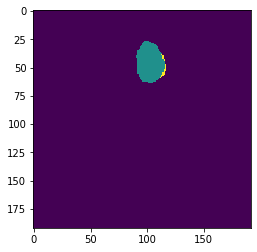

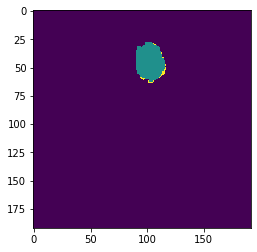

X_test 480


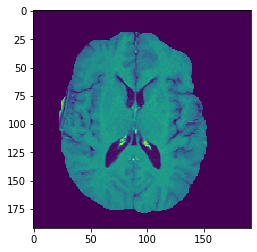

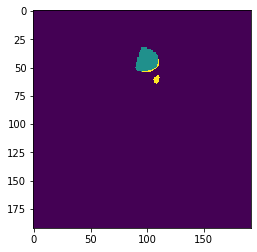

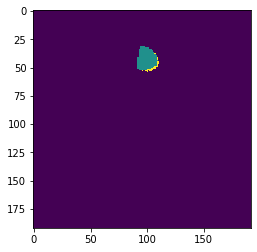

X_test 481


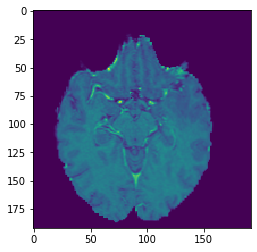

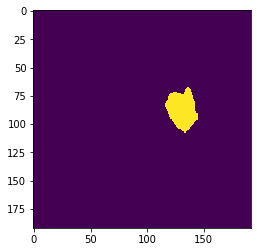

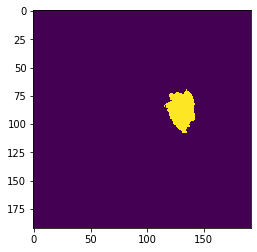

X_test 482


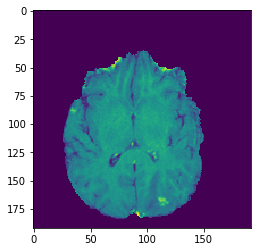

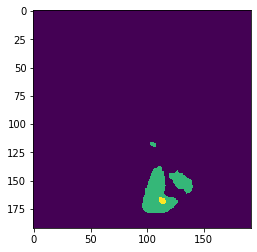

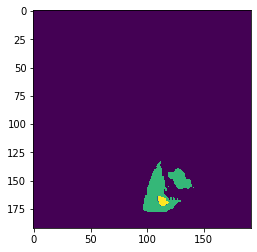

X_test 483


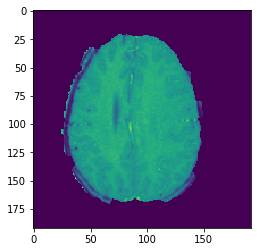

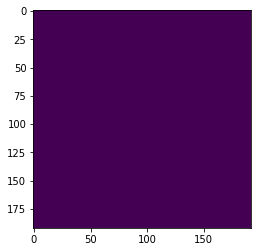

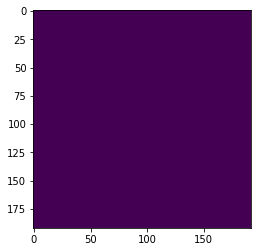

X_test 484


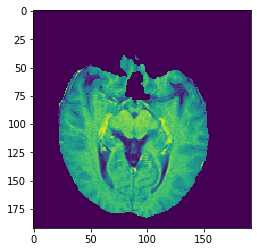

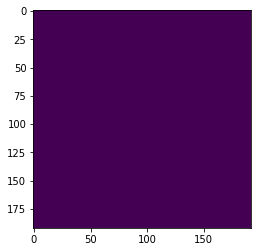

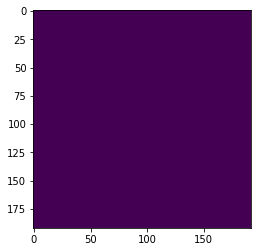

X_test 485


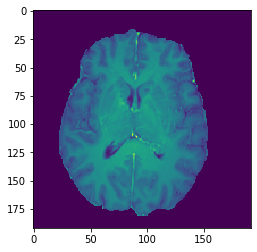

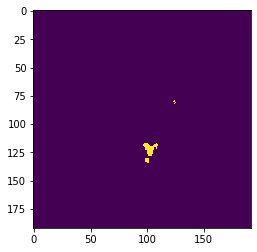

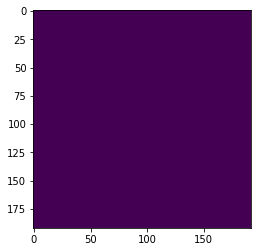

X_test 486


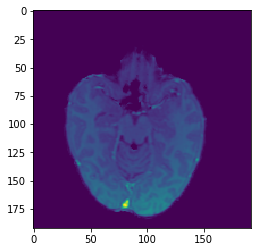

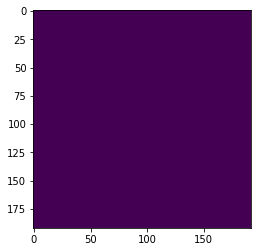

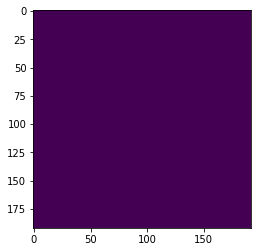

X_test 487


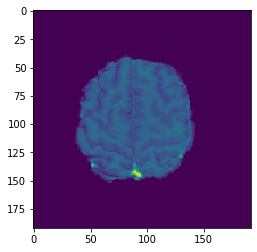

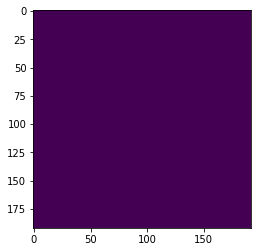

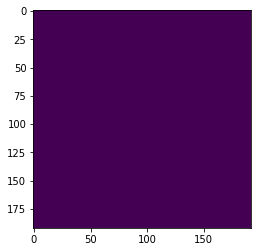

X_test 488


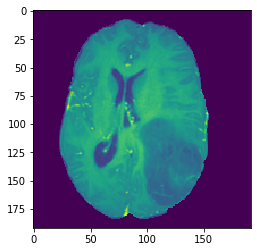

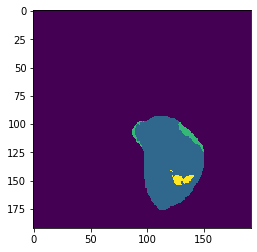

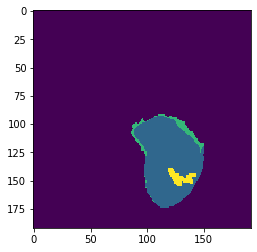

X_test 489


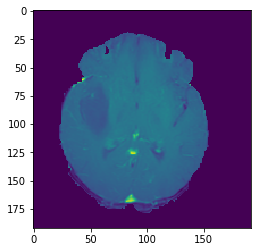

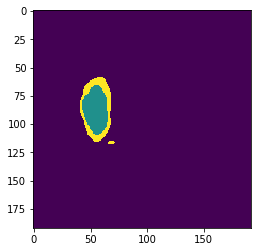

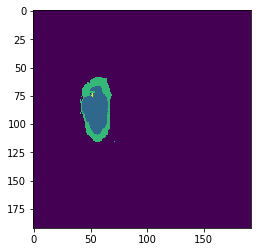

X_test 490


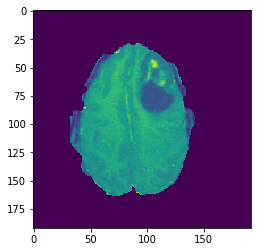

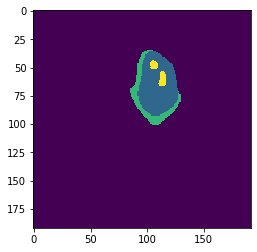

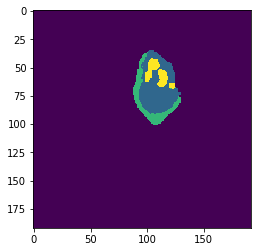

X_test 491


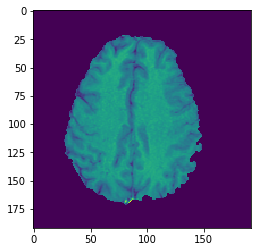

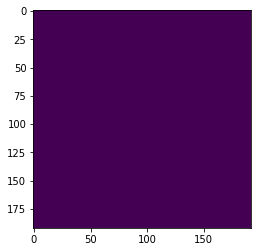

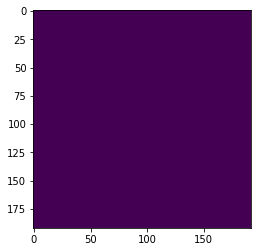

X_test 492


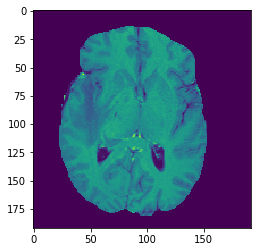

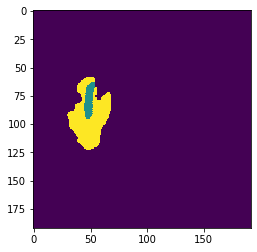

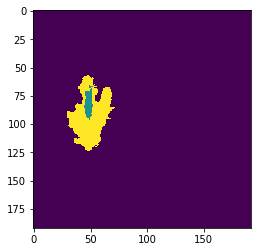

X_test 493


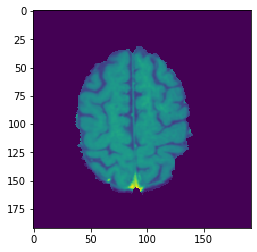

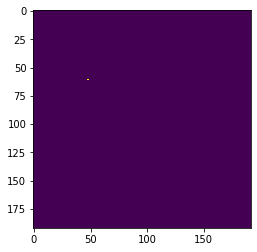

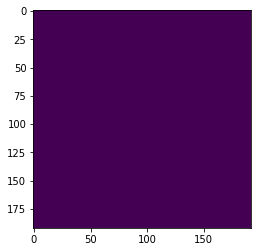

X_test 494


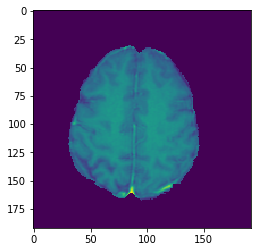

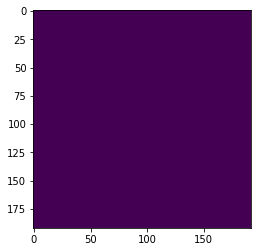

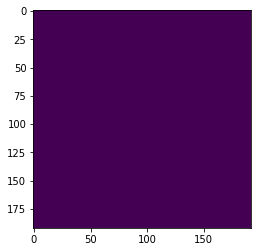

X_test 495


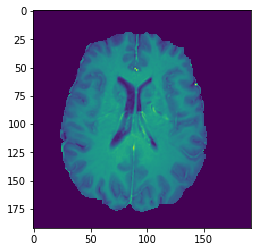

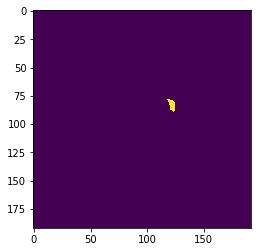

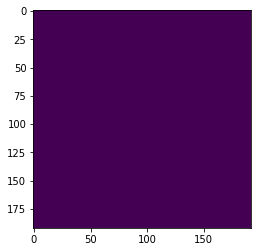

X_test 496


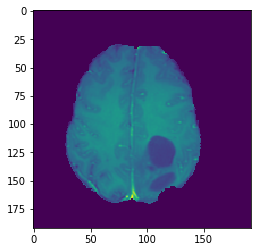

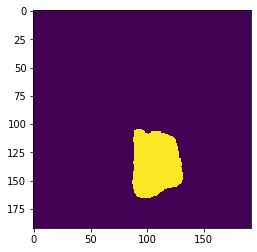

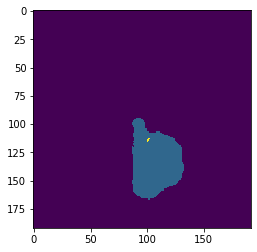

X_test 497


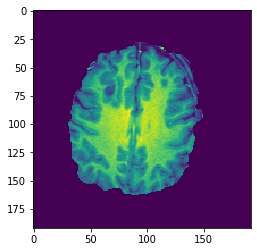

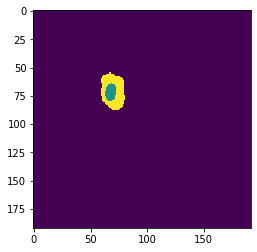

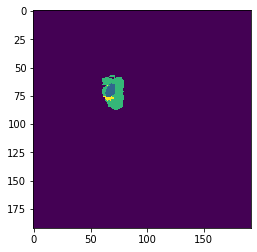

X_test 498


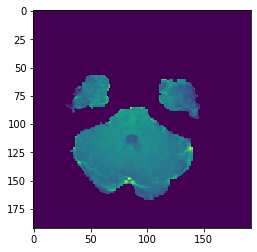

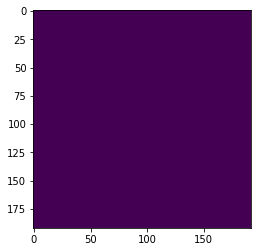

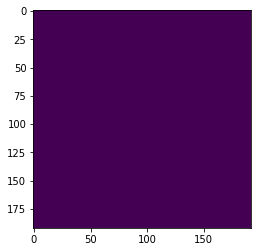

X_test 499


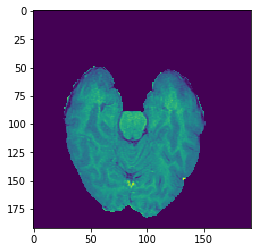

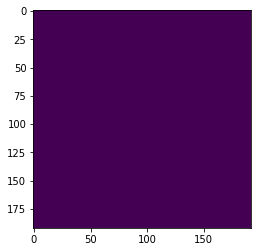

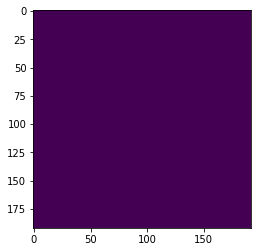

In [19]:
for i in range(450,500):
  print('X_test '+ str(i))
  plt.imshow(X_test[i,:,:,2])
  plt.show()
  plt.imshow(Y_pre[i,:,:,0])
  plt.show()
  plt.imshow(Y_test[i,:,:,0])
  plt.show()

In [0]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [21]:
model.evaluate(X_test,Y_test_encod,verbose=0)

[0.005474171455673598, 0.9945260692525792]

In [0]:
model.save('./Saved Models /model.h5',overwrite=True)

#Evaluation of the Model

In [0]:
import numpy as np
X_test1 = np.load('./Test Data/X_test1.npy')
X_test2 = np.load('./Test Data/X_test2.npy')
X_test3 = np.load('./Test Data/X_test3.npy')
X_test4 = np.load('./Test Data/X_test4.npy')

Y_test1 = np.load('./Test Data/Y_test1.npy')
Y_test2 = np.load('./Test Data/Y_test2.npy')
Y_test3 = np.load('./Test Data/Y_test3.npy')
Y_test4 = np.load('./Test Data/Y_test4.npy')

In [0]:
from keras.utils import to_categorical
Y_test_encod1 = to_categorical(Y_test1)
Y_test_encod2 = to_categorical(Y_test2)
Y_test_encod3 = to_categorical(Y_test3)
Y_test_encod4 = to_categorical(Y_test4)

In [8]:
model.compile(optimizer=Adam(lr=1e-5),loss=[dice_coef_loss],metrics=[dice_coef])

In [0]:
model.load_weights('./Model Checkpoints/weights.hdf5')

In [12]:
print('HGG Test set no: 1 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test1,Y_test_encod1,batch_size=32,verbose=2))[1]))
print('HGG Test set no: 2 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test2,Y_test_encod2,batch_size=32,verbose=2))[1]))
print('HGG Test set no: 3 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test3,Y_test_encod3,batch_size=32,verbose=2))[1]))
print('LGG Test set no: 4 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test4,Y_test_encod4,batch_size=32,verbose=2))[1]))

HGG Test set no: 1 with Dice Coefficient:- 0.9795
HGG Test set no: 2 with Dice Coefficient:- 0.9855
HGG Test set no: 3 with Dice Coefficient:- 0.9793
LGG Test set no: 4 with Dice Coefficient:- 0.9950


In [0]:
Y_pred1 = np.argmax(model.predict(X_test1),axis=-1).reshape(-1,192,192,1)
Y_pred2 = np.argmax(model.predict(X_test2),axis=-1).reshape(-1,192,192,1)
Y_pred3 = np.argmax(model.predict(X_test3),axis=-1).reshape(-1,192,192,1)
Y_pred4 = np.argmax(model.predict(X_test4),axis=-1).reshape(-1,192,192,1)

HGG test set no: 1 slice no: 450


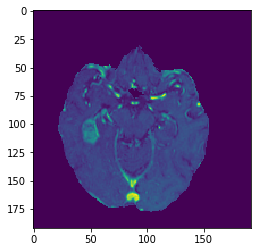

Predicted:- 


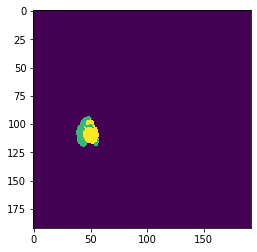

Actual:- 


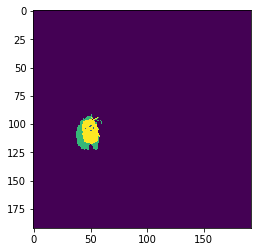

HGG test set no: 1 slice no: 451


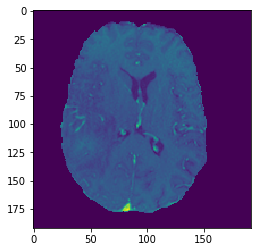

Predicted:- 


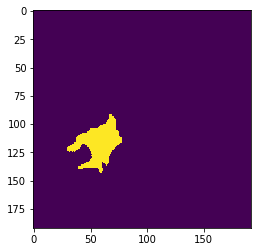

Actual:- 


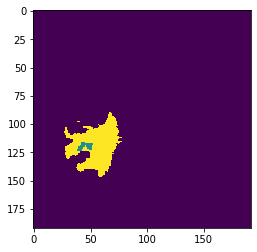

HGG test set no: 1 slice no: 452


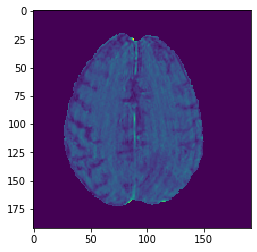

Predicted:- 


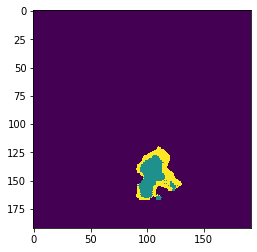

Actual:- 


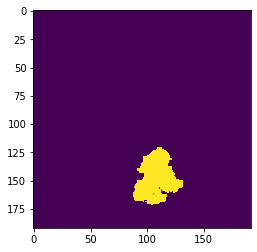

HGG test set no: 1 slice no: 453


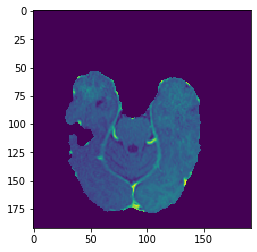

Predicted:- 


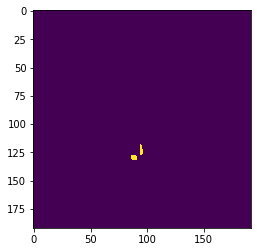

Actual:- 


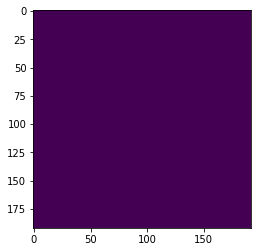

HGG test set no: 1 slice no: 454


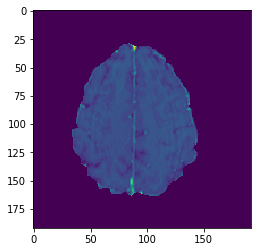

Predicted:- 


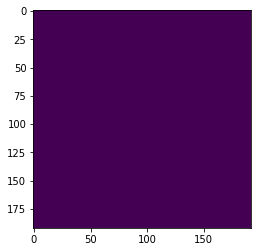

Actual:- 


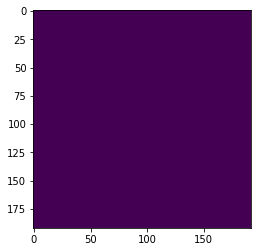

HGG test set no: 1 slice no: 455


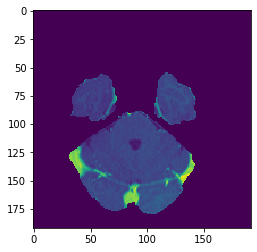

Predicted:- 


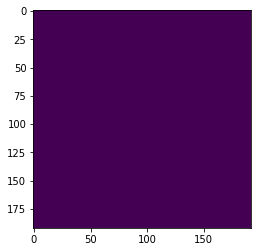

Actual:- 


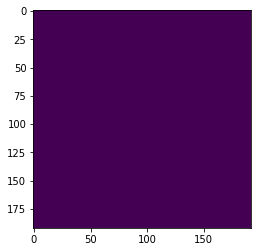

HGG test set no: 1 slice no: 456


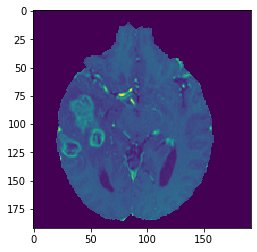

Predicted:- 


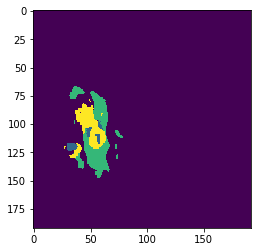

Actual:- 


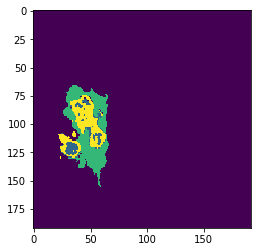

HGG test set no: 1 slice no: 457


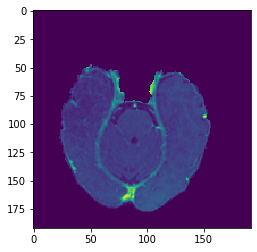

Predicted:- 


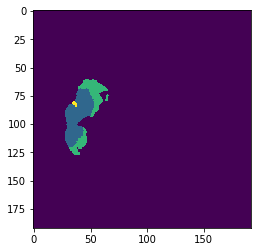

Actual:- 


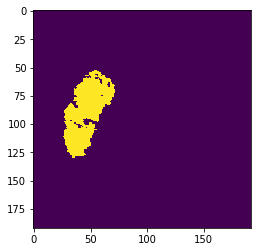

HGG test set no: 1 slice no: 458


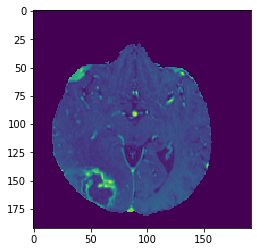

Predicted:- 


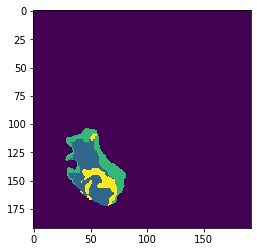

Actual:- 


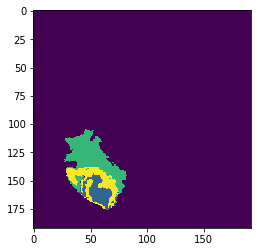

HGG test set no: 1 slice no: 459


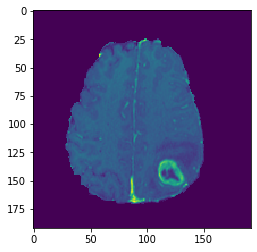

Predicted:- 


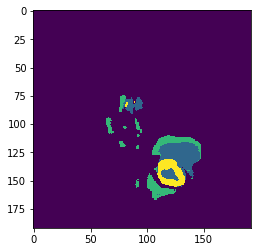

Actual:- 


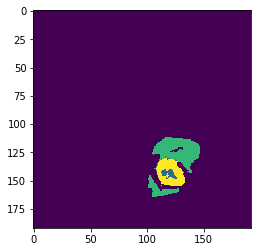

HGG test set no: 1 slice no: 460


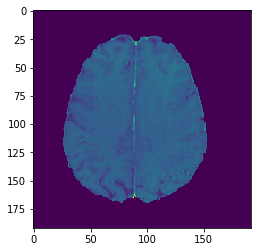

Predicted:- 


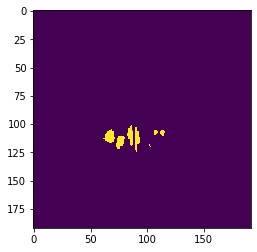

Actual:- 


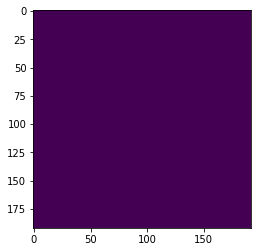

HGG test set no: 1 slice no: 461


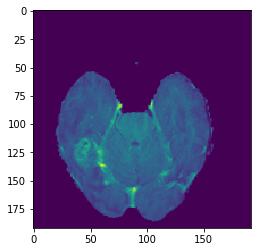

Predicted:- 


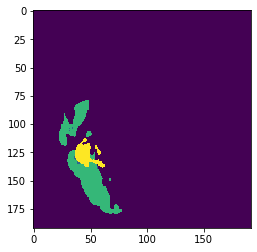

Actual:- 


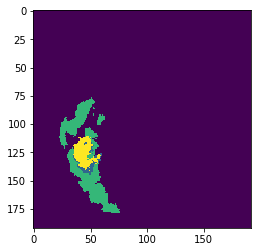

HGG test set no: 1 slice no: 462


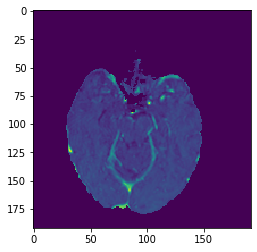

Predicted:- 


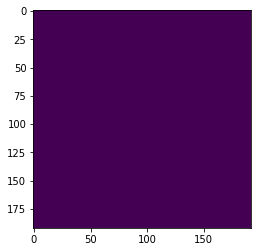

Actual:- 


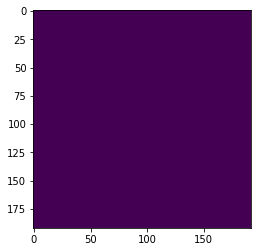

HGG test set no: 1 slice no: 463


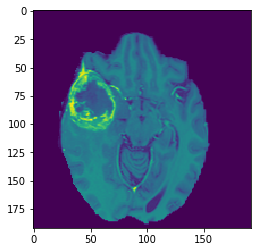

Predicted:- 


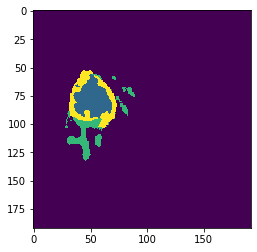

Actual:- 


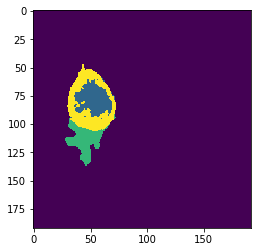

HGG test set no: 1 slice no: 464


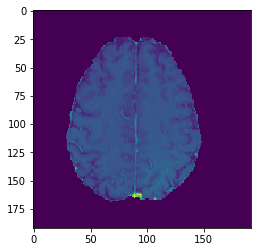

Predicted:- 


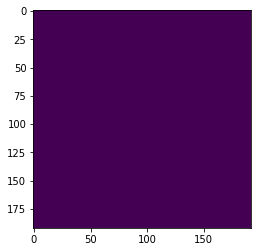

Actual:- 


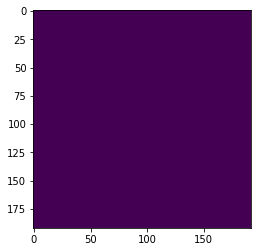

HGG test set no: 1 slice no: 465


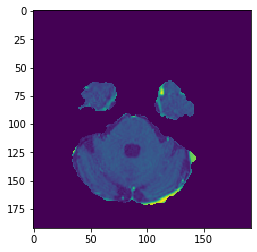

Predicted:- 


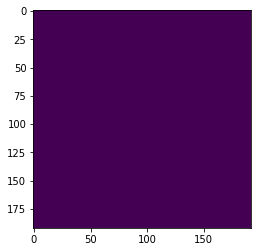

Actual:- 


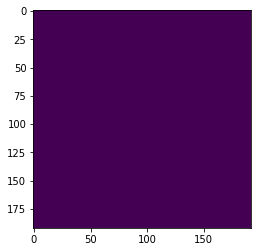

HGG test set no: 1 slice no: 466


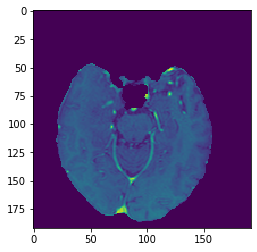

Predicted:- 


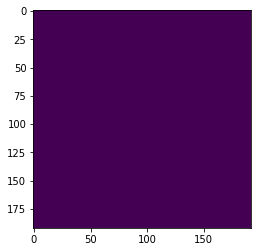

Actual:- 


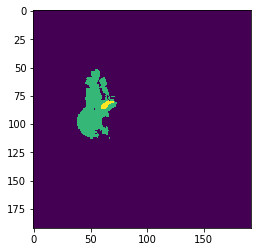

HGG test set no: 1 slice no: 467


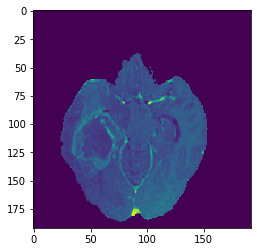

Predicted:- 


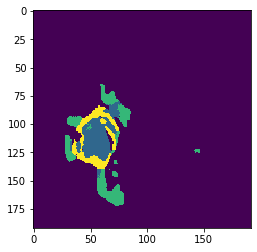

Actual:- 


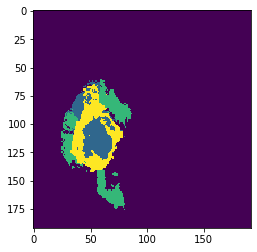

HGG test set no: 1 slice no: 468


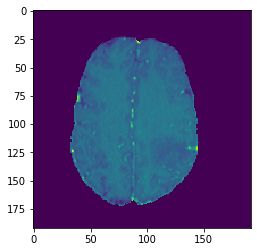

Predicted:- 


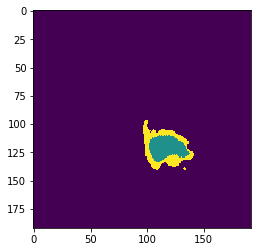

Actual:- 


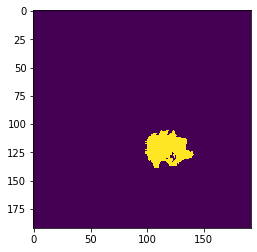

HGG test set no: 1 slice no: 469


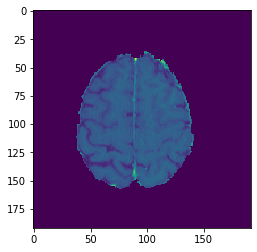

Predicted:- 


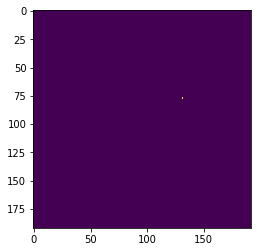

Actual:- 


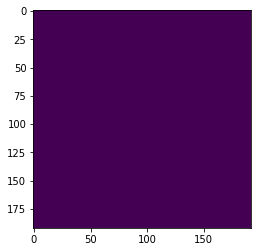

HGG test set no: 1 slice no: 470


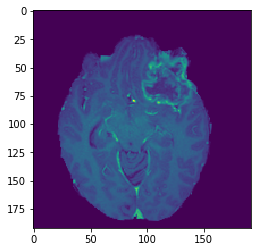

Predicted:- 


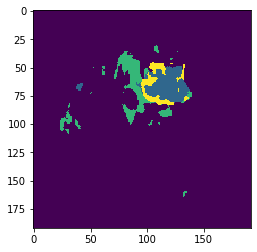

Actual:- 


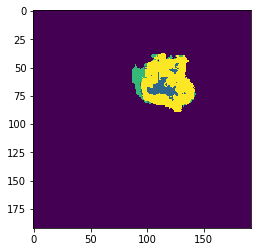

HGG test set no: 1 slice no: 471


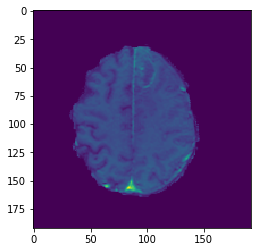

Predicted:- 


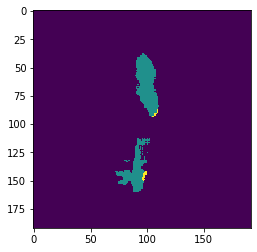

Actual:- 


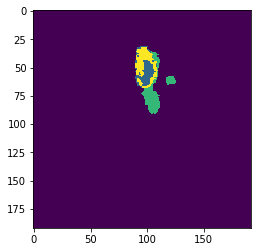

HGG test set no: 1 slice no: 472


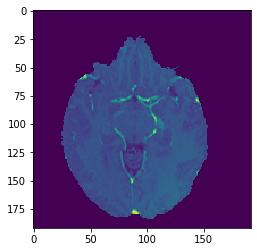

Predicted:- 


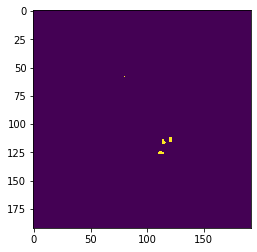

Actual:- 


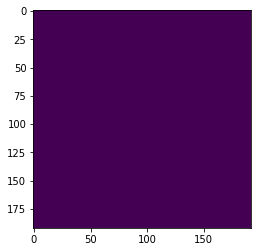

HGG test set no: 1 slice no: 473


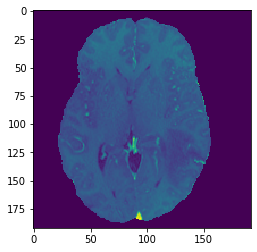

Predicted:- 


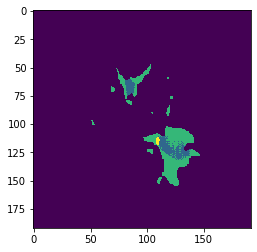

Actual:- 


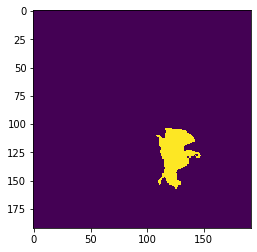

HGG test set no: 1 slice no: 474


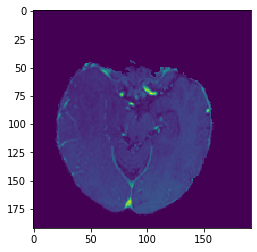

Predicted:- 


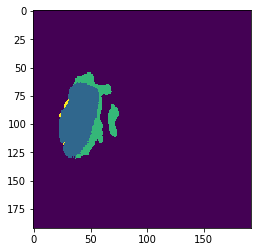

Actual:- 


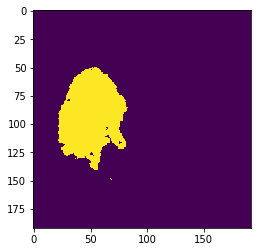

HGG test set no: 1 slice no: 475


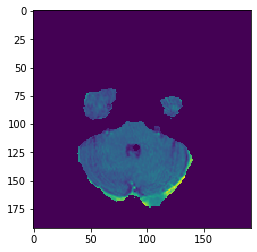

Predicted:- 


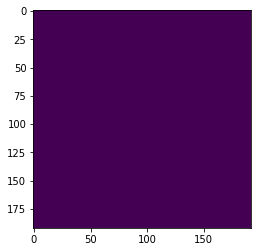

Actual:- 


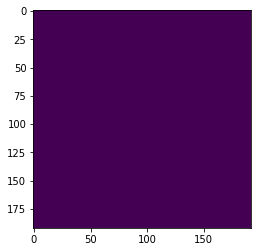

HGG test set no: 1 slice no: 476


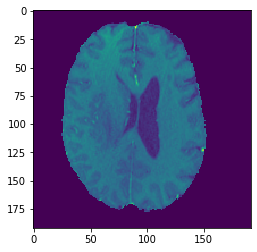

Predicted:- 


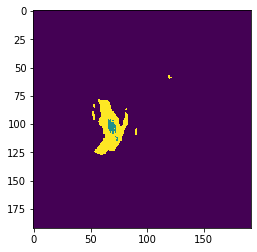

Actual:- 


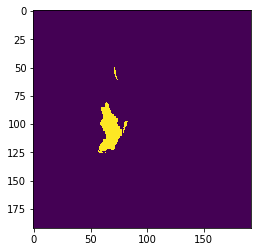

HGG test set no: 1 slice no: 477


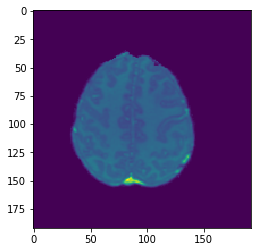

Predicted:- 


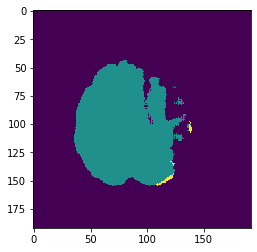

Actual:- 


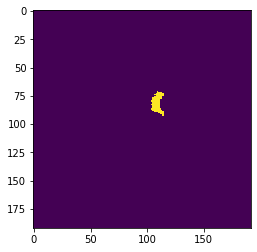

HGG test set no: 1 slice no: 478


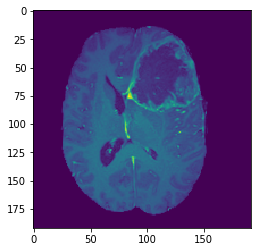

Predicted:- 


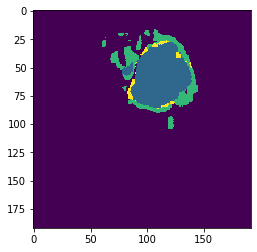

Actual:- 


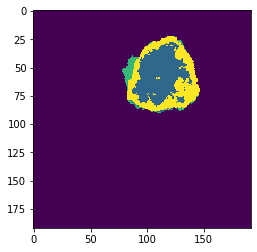

HGG test set no: 1 slice no: 479


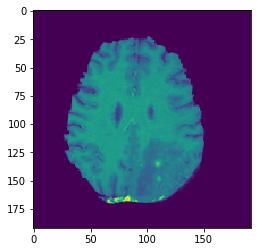

Predicted:- 


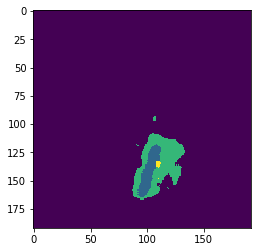

Actual:- 


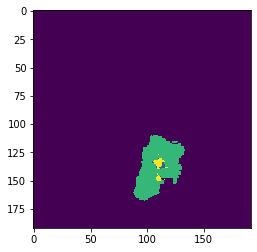

HGG test set no: 1 slice no: 480


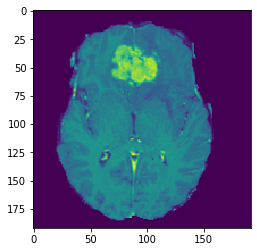

Predicted:- 


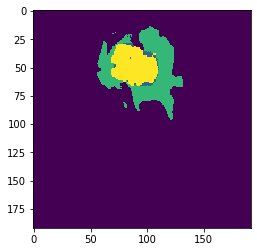

Actual:- 


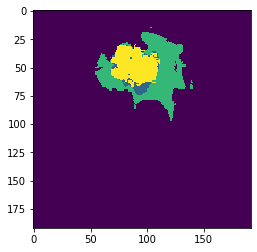

HGG test set no: 1 slice no: 481


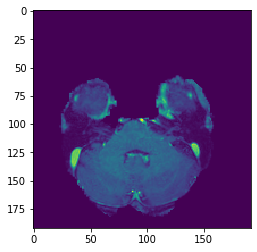

Predicted:- 


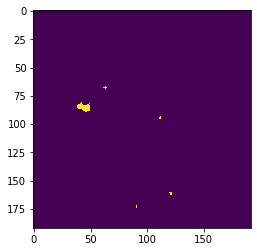

Actual:- 


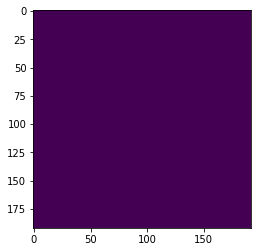

HGG test set no: 1 slice no: 482


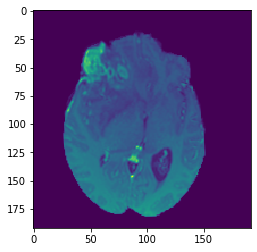

Predicted:- 


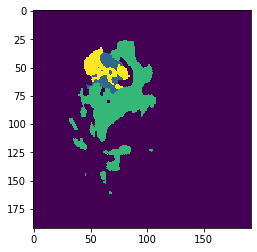

Actual:- 


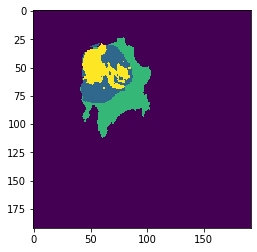

HGG test set no: 1 slice no: 483


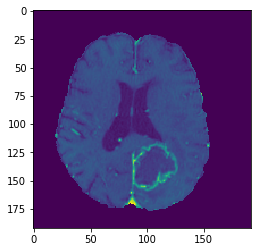

Predicted:- 


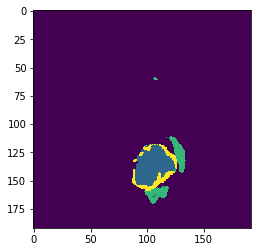

Actual:- 


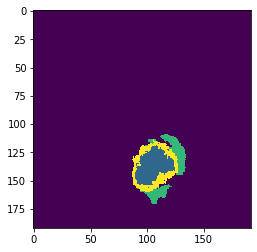

HGG test set no: 1 slice no: 484


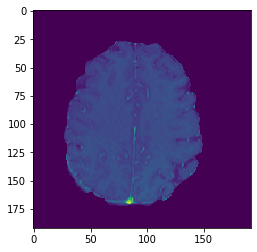

Predicted:- 


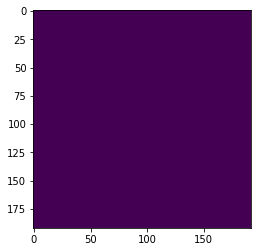

Actual:- 


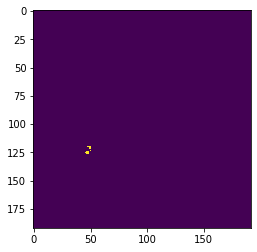

HGG test set no: 1 slice no: 485


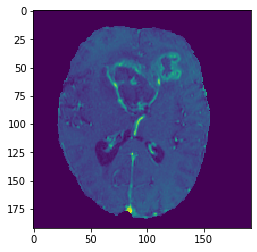

Predicted:- 


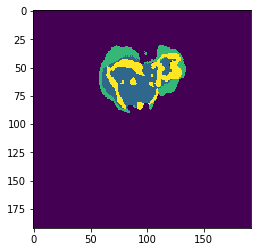

Actual:- 


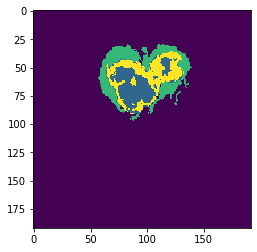

HGG test set no: 1 slice no: 486


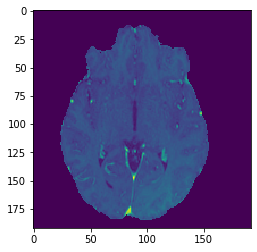

Predicted:- 


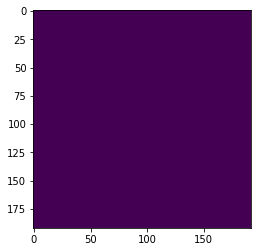

Actual:- 


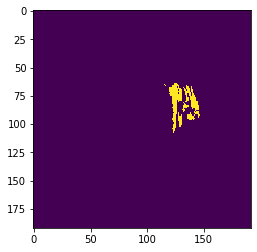

HGG test set no: 1 slice no: 487


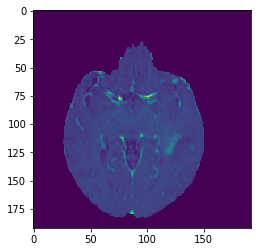

Predicted:- 


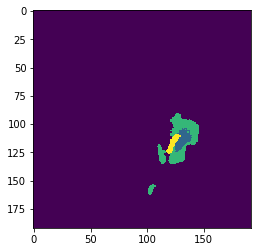

Actual:- 


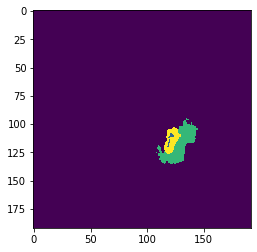

HGG test set no: 1 slice no: 488


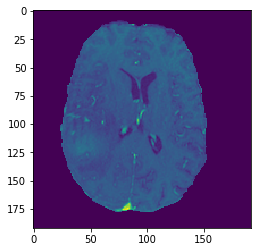

Predicted:- 


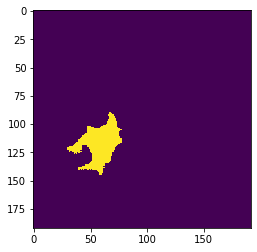

Actual:- 


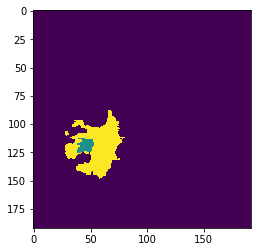

HGG test set no: 1 slice no: 489


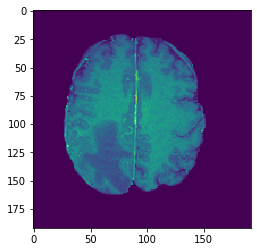

Predicted:- 


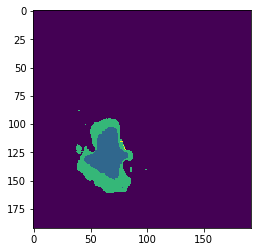

Actual:- 


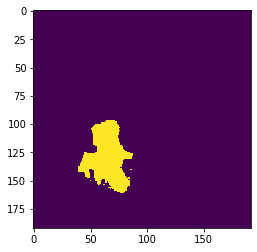

HGG test set no: 1 slice no: 490


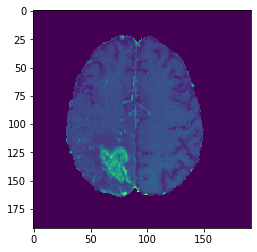

Predicted:- 


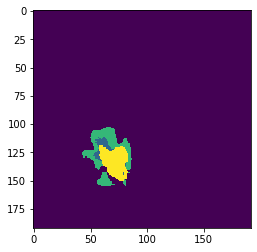

Actual:- 


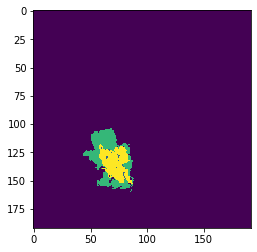

HGG test set no: 1 slice no: 491


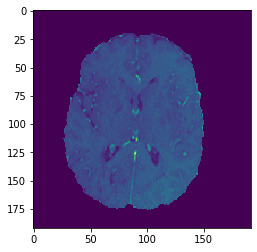

Predicted:- 


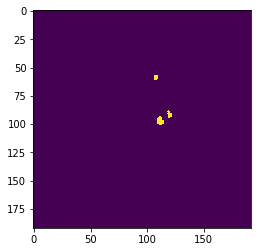

Actual:- 


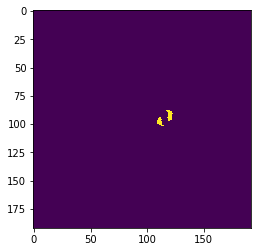

HGG test set no: 1 slice no: 492


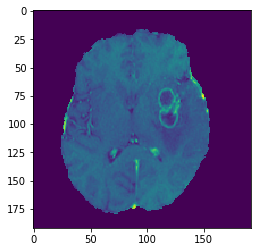

Predicted:- 


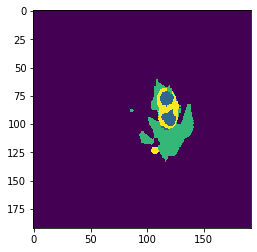

Actual:- 


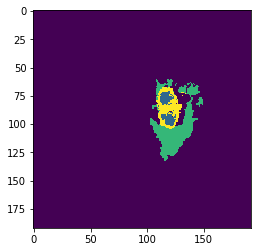

HGG test set no: 1 slice no: 493


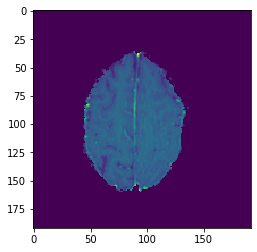

Predicted:- 


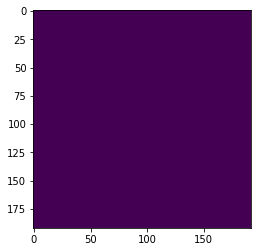

Actual:- 


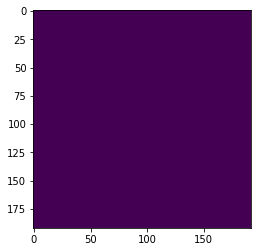

HGG test set no: 1 slice no: 494


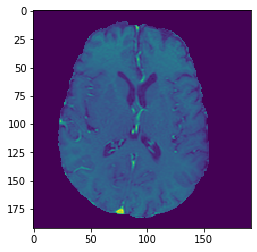

Predicted:- 


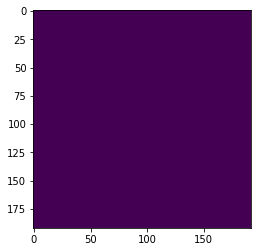

Actual:- 


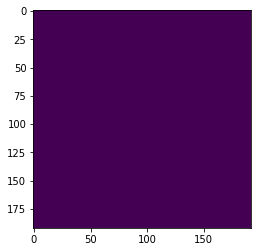

HGG test set no: 1 slice no: 495


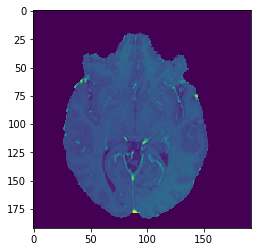

Predicted:- 


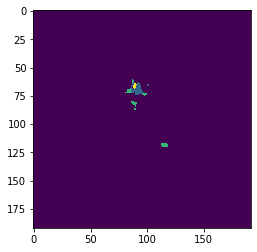

Actual:- 


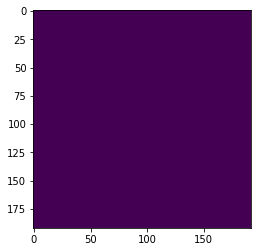

HGG test set no: 1 slice no: 496


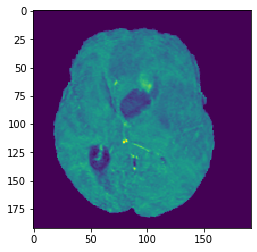

Predicted:- 


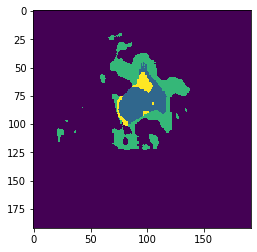

Actual:- 


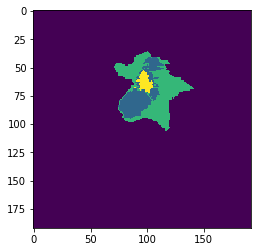

HGG test set no: 1 slice no: 497


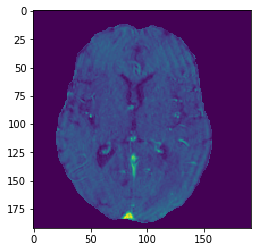

Predicted:- 


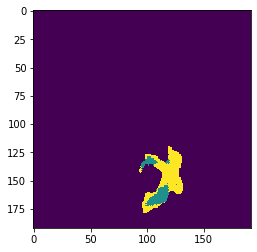

Actual:- 


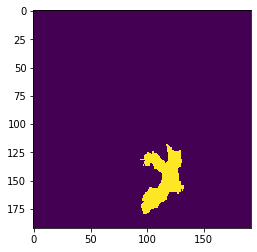

HGG test set no: 1 slice no: 498


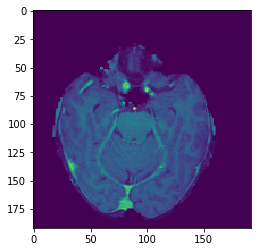

Predicted:- 


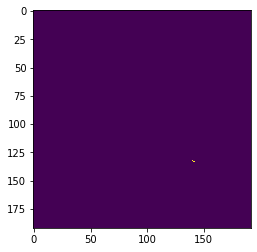

Actual:- 


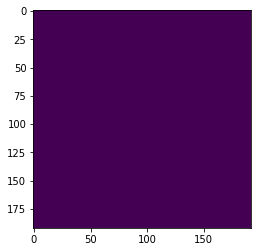

HGG test set no: 1 slice no: 499


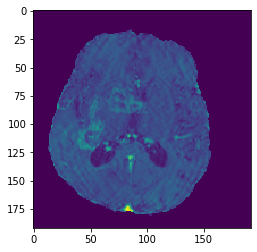

Predicted:- 


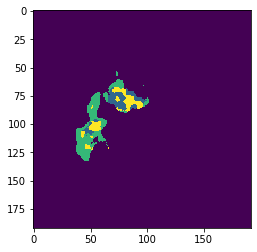

Actual:- 


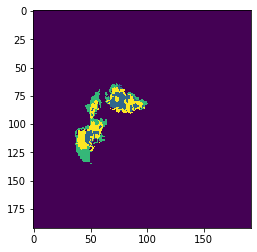

HGG test set no: 2 slice no: 450


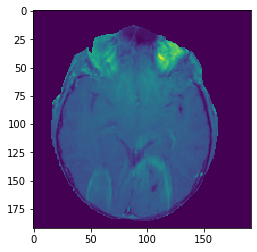

Predicted:- 


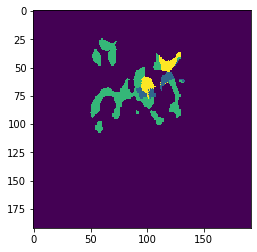

Actual:- 


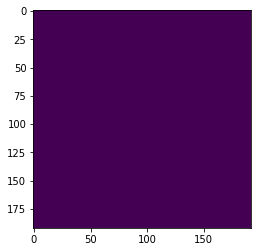

HGG test set no: 2 slice no: 451


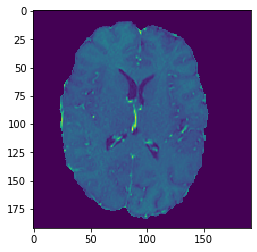

Predicted:- 


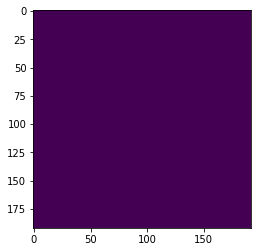

Actual:- 


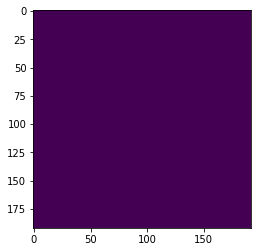

HGG test set no: 2 slice no: 452


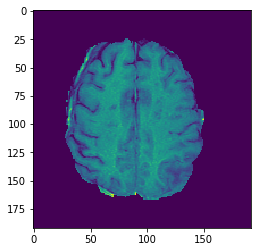

Predicted:- 


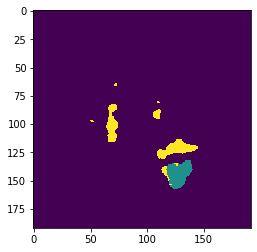

Actual:- 


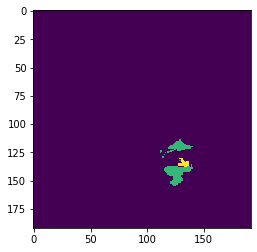

HGG test set no: 2 slice no: 453


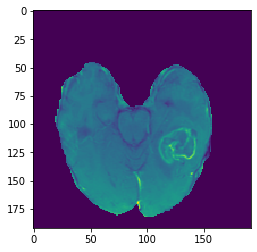

Predicted:- 


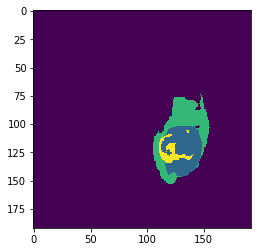

Actual:- 


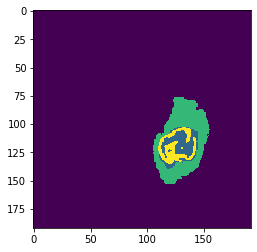

HGG test set no: 2 slice no: 454


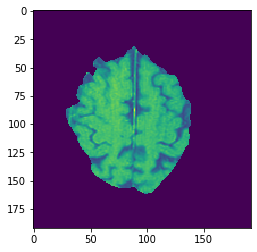

Predicted:- 


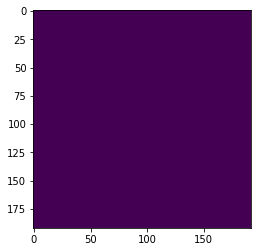

Actual:- 


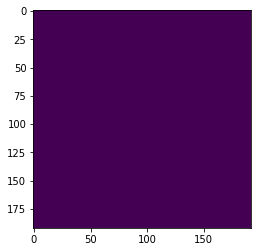

HGG test set no: 2 slice no: 455


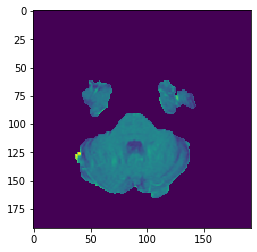

Predicted:- 


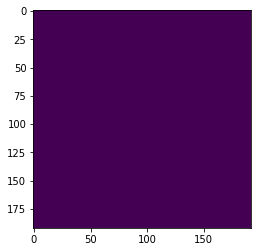

Actual:- 


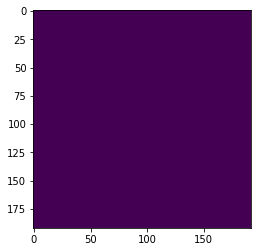

HGG test set no: 2 slice no: 456


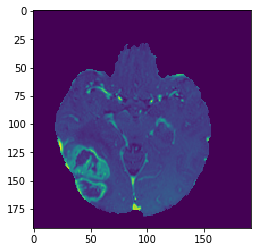

Predicted:- 


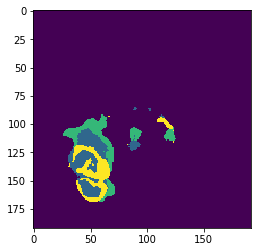

Actual:- 


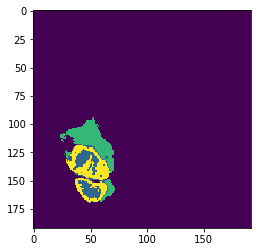

HGG test set no: 2 slice no: 457


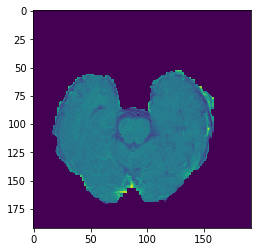

Predicted:- 


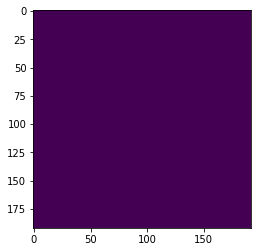

Actual:- 


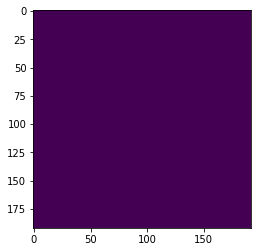

HGG test set no: 2 slice no: 458


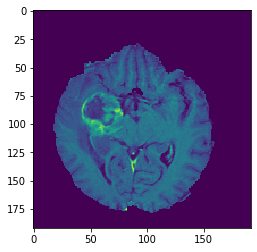

Predicted:- 


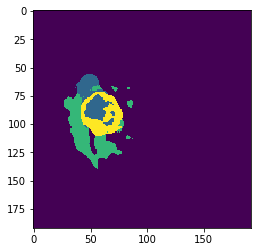

Actual:- 


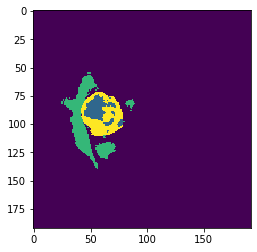

HGG test set no: 2 slice no: 459


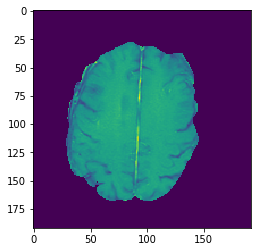

Predicted:- 


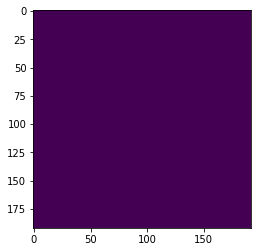

Actual:- 


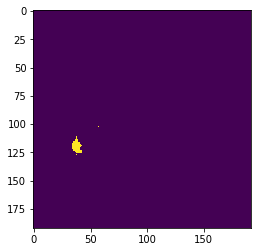

HGG test set no: 2 slice no: 460


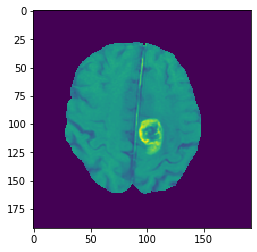

Predicted:- 


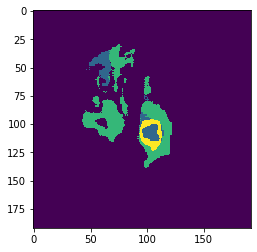

Actual:- 


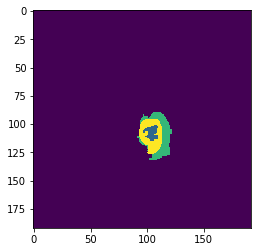

HGG test set no: 2 slice no: 461


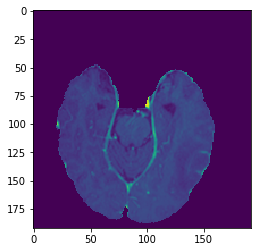

Predicted:- 


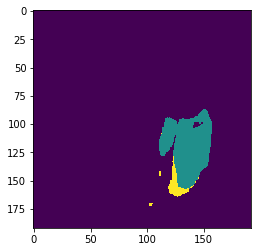

Actual:- 


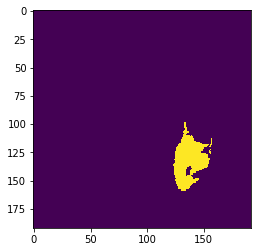

HGG test set no: 2 slice no: 462


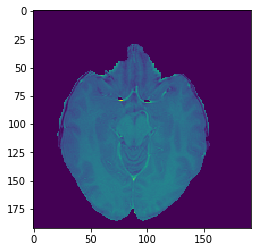

Predicted:- 


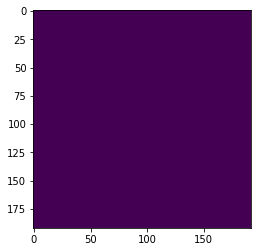

Actual:- 


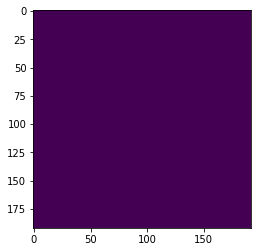

HGG test set no: 2 slice no: 463


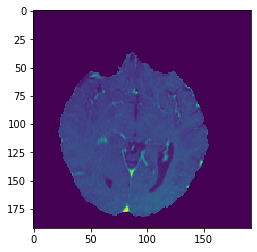

Predicted:- 


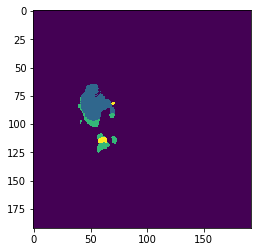

Actual:- 


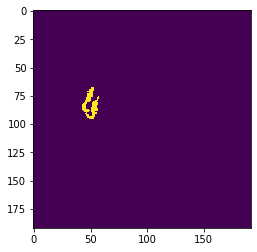

HGG test set no: 2 slice no: 464


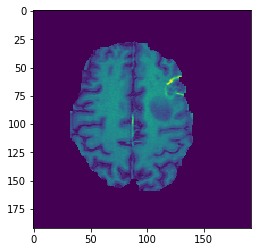

Predicted:- 


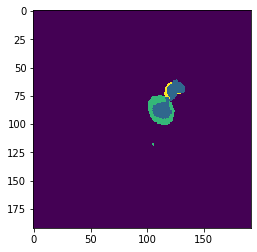

Actual:- 


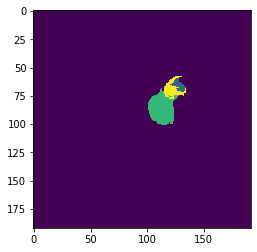

HGG test set no: 2 slice no: 465


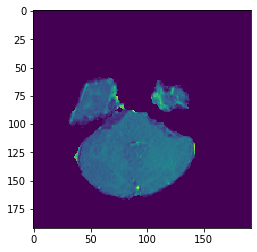

Predicted:- 


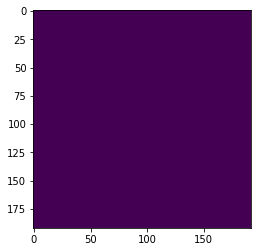

Actual:- 


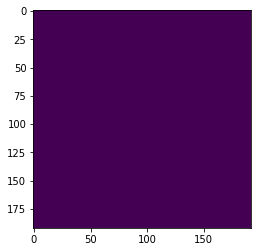

HGG test set no: 2 slice no: 466


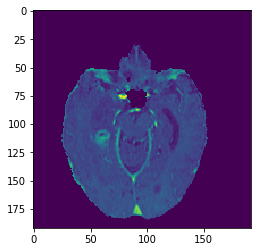

Predicted:- 


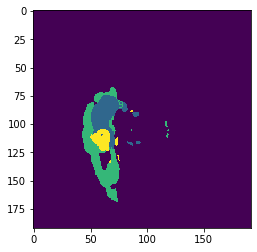

Actual:- 


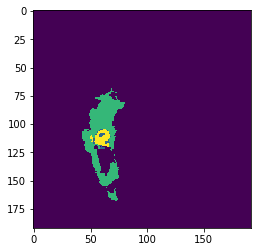

HGG test set no: 2 slice no: 467


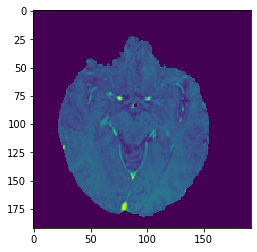

Predicted:- 


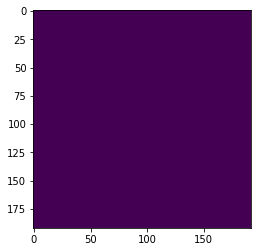

Actual:- 


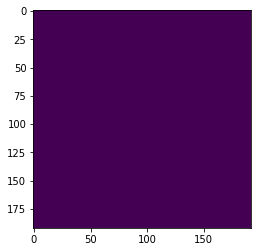

HGG test set no: 2 slice no: 468


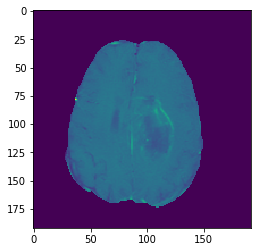

Predicted:- 


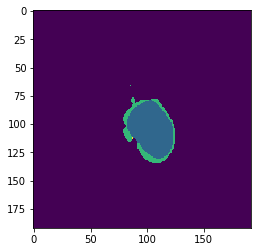

Actual:- 


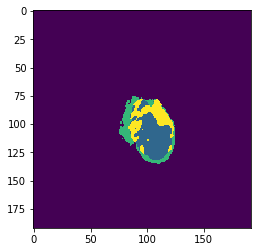

HGG test set no: 2 slice no: 469


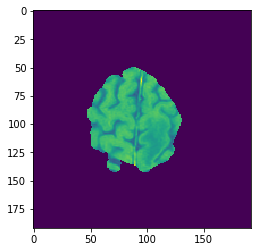

Predicted:- 


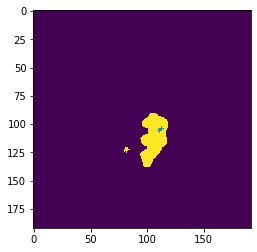

Actual:- 


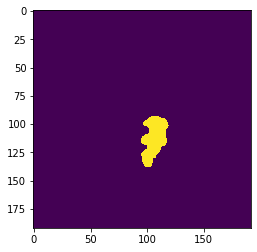

HGG test set no: 2 slice no: 470


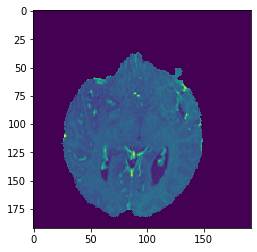

Predicted:- 


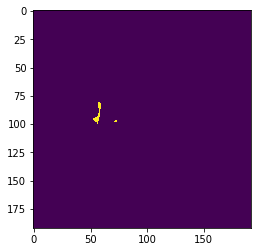

Actual:- 


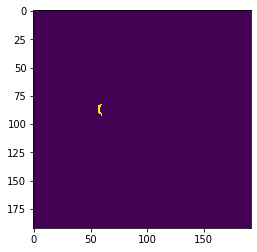

HGG test set no: 2 slice no: 471


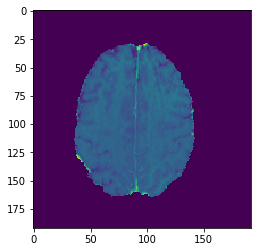

Predicted:- 


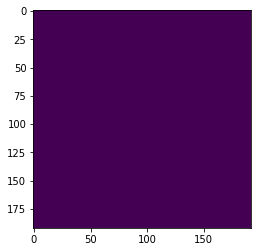

Actual:- 


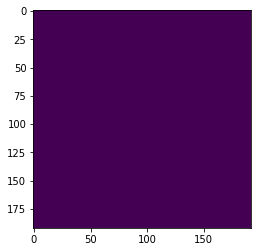

HGG test set no: 2 slice no: 472


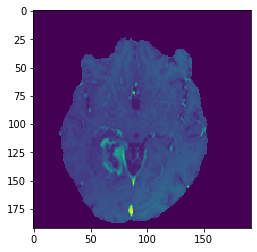

Predicted:- 


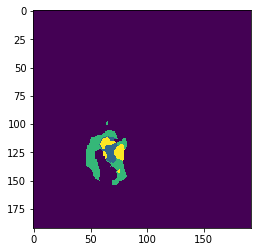

Actual:- 


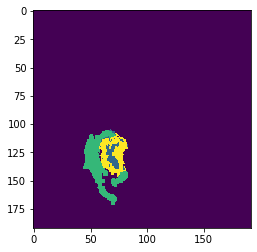

HGG test set no: 2 slice no: 473


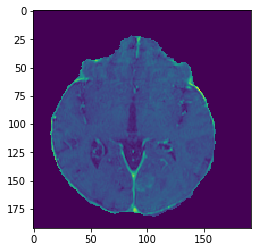

Predicted:- 


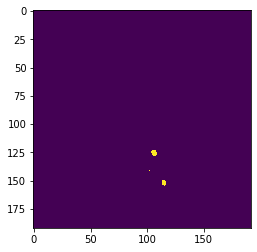

Actual:- 


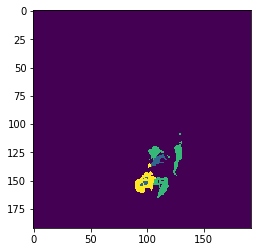

HGG test set no: 2 slice no: 474


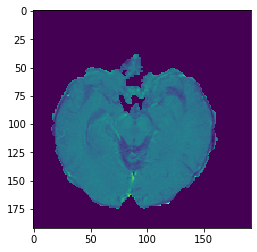

Predicted:- 


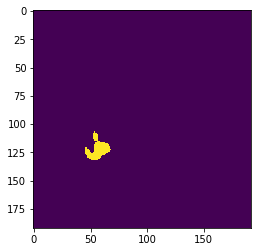

Actual:- 


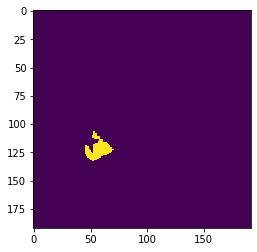

HGG test set no: 2 slice no: 475


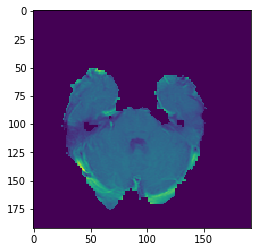

Predicted:- 


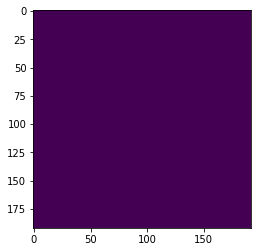

Actual:- 


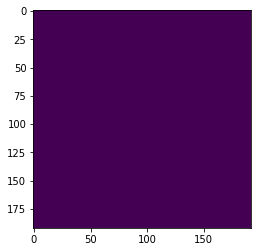

HGG test set no: 2 slice no: 476


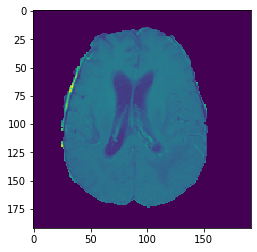

Predicted:- 


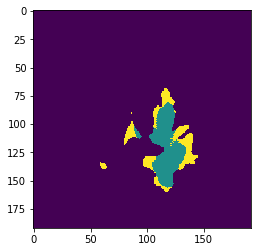

Actual:- 


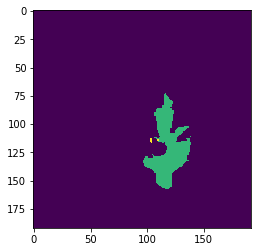

HGG test set no: 2 slice no: 477


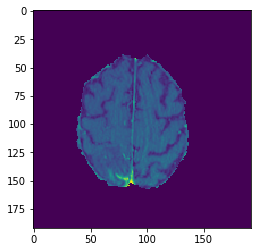

Predicted:- 


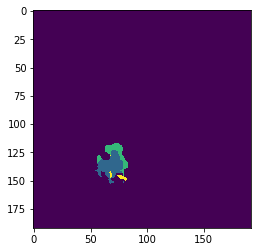

Actual:- 


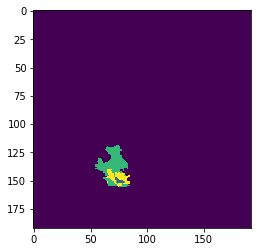

HGG test set no: 2 slice no: 478


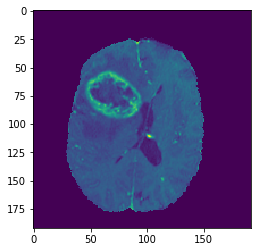

Predicted:- 


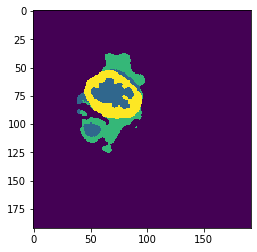

Actual:- 


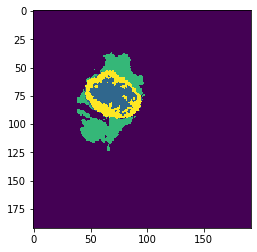

HGG test set no: 2 slice no: 479


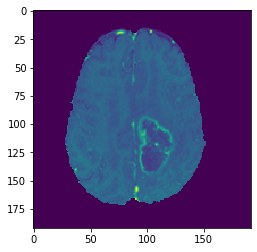

Predicted:- 


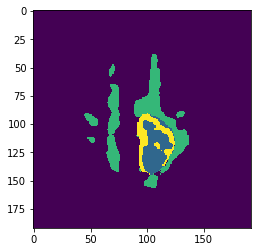

Actual:- 


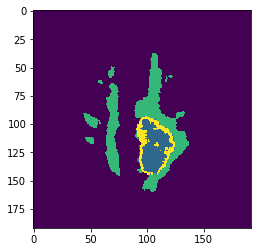

HGG test set no: 2 slice no: 480


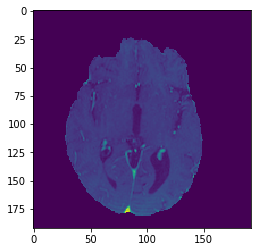

Predicted:- 


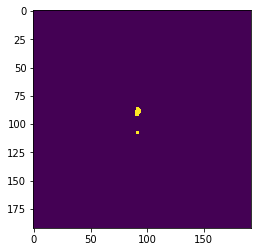

Actual:- 


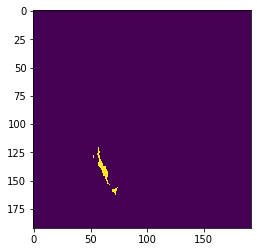

HGG test set no: 2 slice no: 481


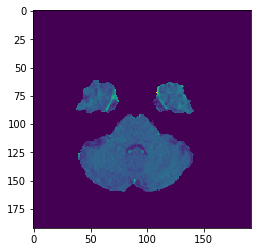

Predicted:- 


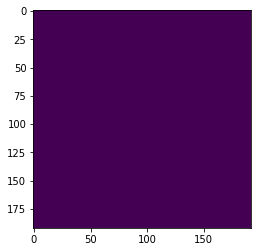

Actual:- 


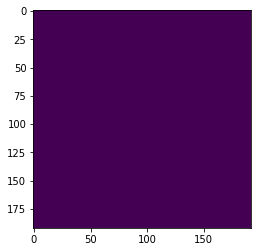

HGG test set no: 2 slice no: 482


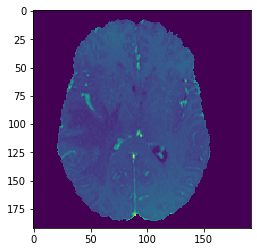

Predicted:- 


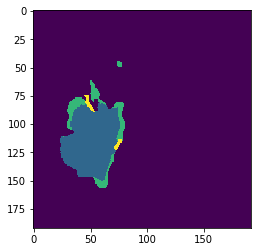

Actual:- 


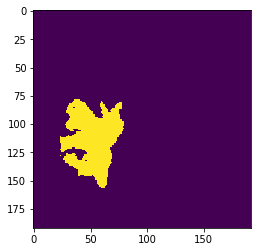

HGG test set no: 2 slice no: 483


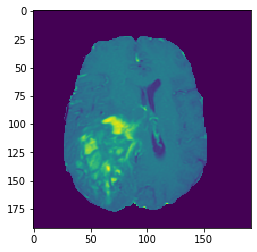

Predicted:- 


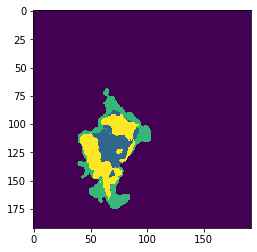

Actual:- 


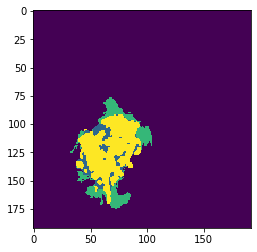

HGG test set no: 2 slice no: 484


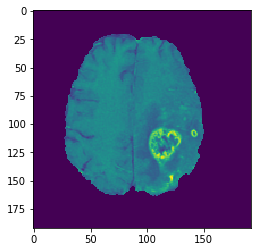

Predicted:- 


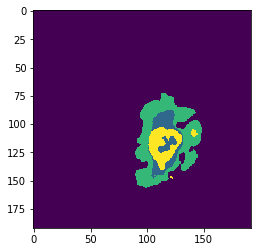

Actual:- 


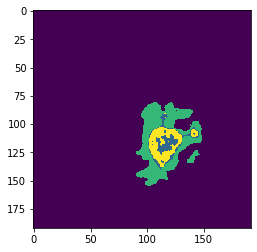

HGG test set no: 2 slice no: 485


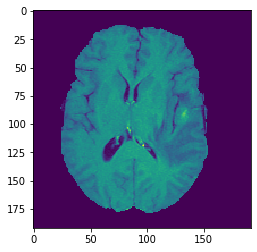

Predicted:- 


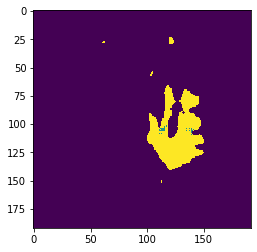

Actual:- 


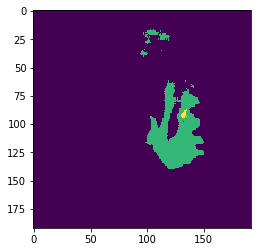

HGG test set no: 2 slice no: 486


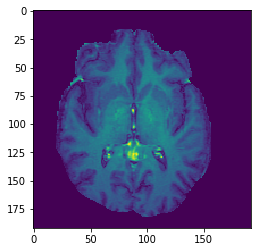

Predicted:- 


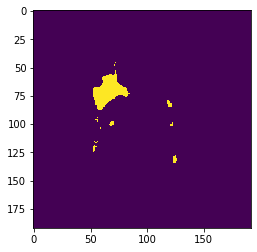

Actual:- 


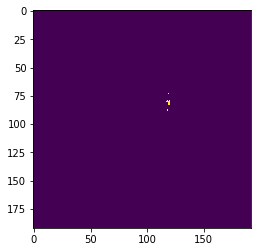

HGG test set no: 2 slice no: 487


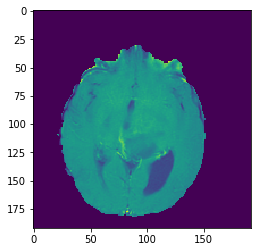

Predicted:- 


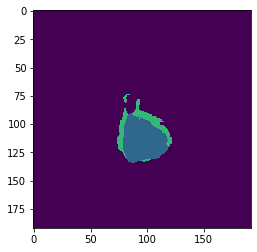

Actual:- 


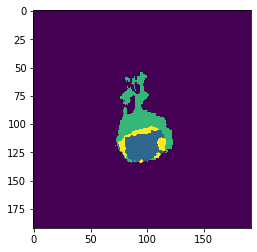

HGG test set no: 2 slice no: 488


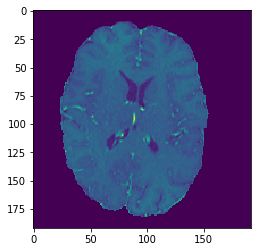

Predicted:- 


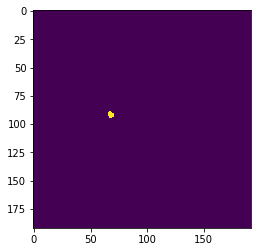

Actual:- 


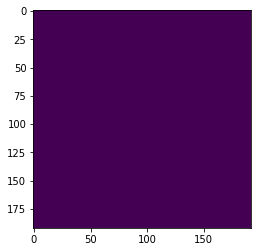

HGG test set no: 2 slice no: 489


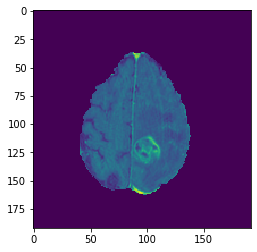

Predicted:- 


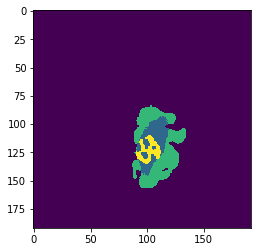

Actual:- 


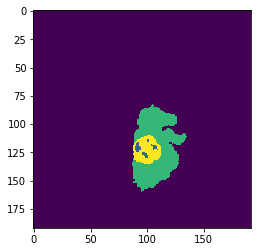

HGG test set no: 2 slice no: 490


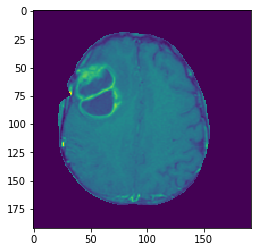

Predicted:- 


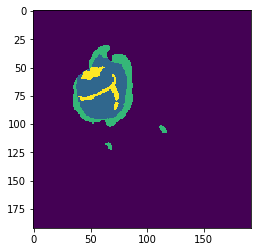

Actual:- 


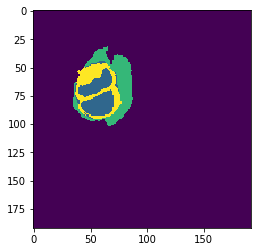

HGG test set no: 2 slice no: 491


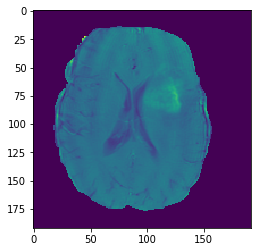

Predicted:- 


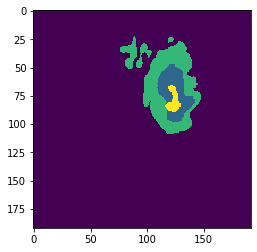

Actual:- 


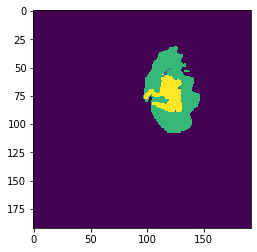

HGG test set no: 2 slice no: 492


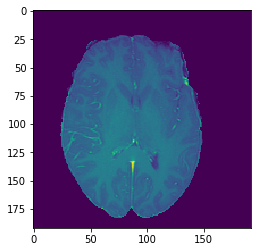

Predicted:- 


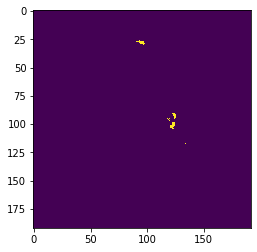

Actual:- 


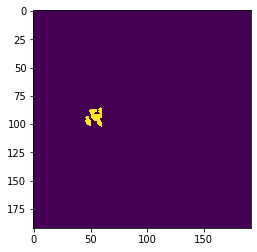

HGG test set no: 2 slice no: 493


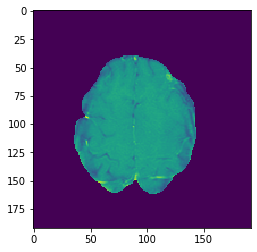

Predicted:- 


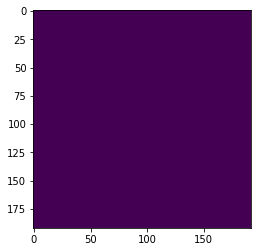

Actual:- 


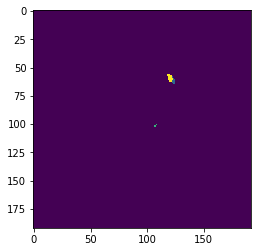

HGG test set no: 2 slice no: 494


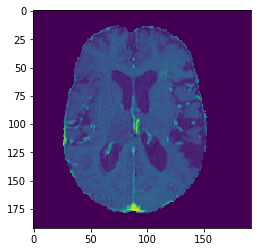

Predicted:- 


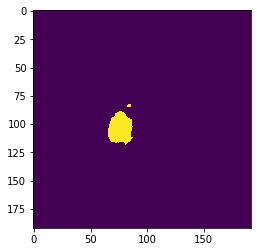

Actual:- 


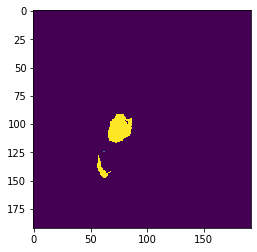

HGG test set no: 2 slice no: 495


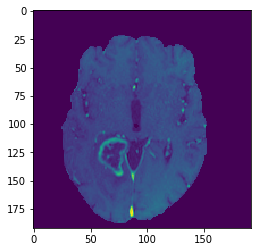

Predicted:- 


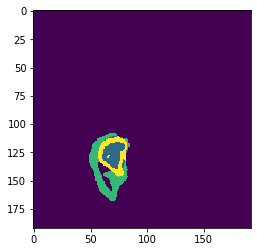

Actual:- 


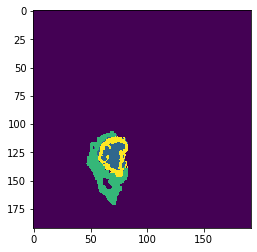

HGG test set no: 2 slice no: 496


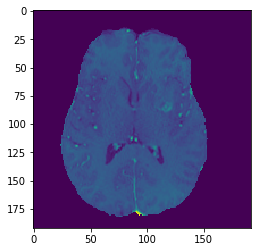

Predicted:- 


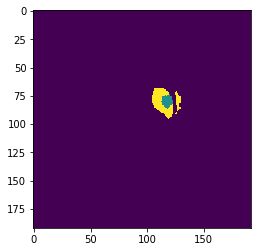

Actual:- 


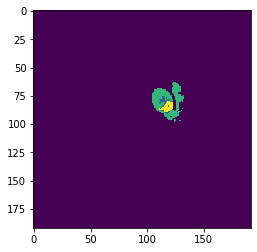

HGG test set no: 2 slice no: 497


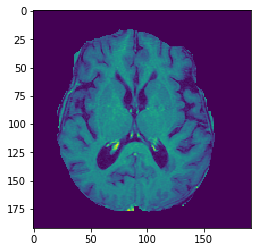

Predicted:- 


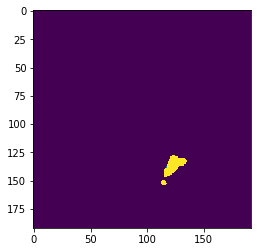

Actual:- 


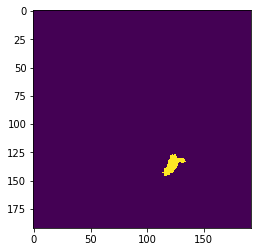

HGG test set no: 2 slice no: 498


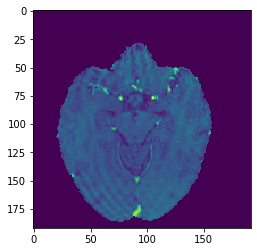

Predicted:- 


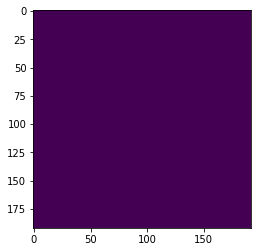

Actual:- 


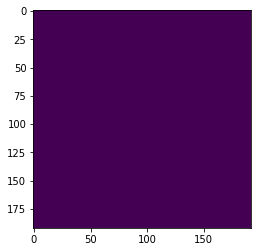

HGG test set no: 2 slice no: 499


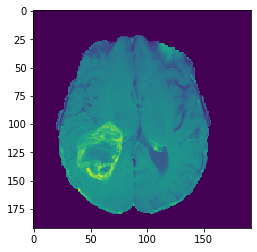

Predicted:- 


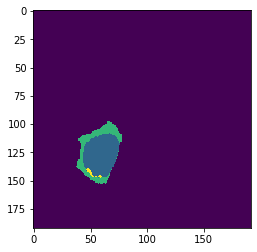

Actual:- 


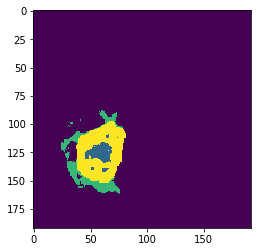

HGG test set no: 3 slice no: 450


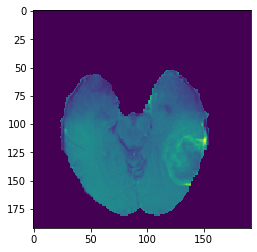

Predicted:- 


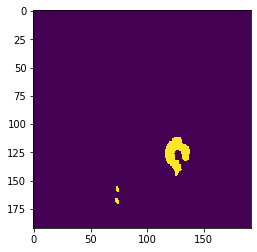

Actual:- 


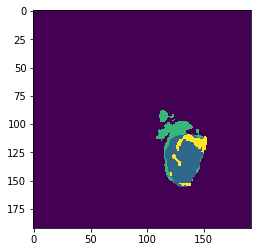

HGG test set no: 3 slice no: 451


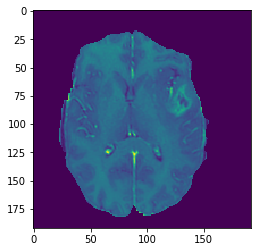

Predicted:- 


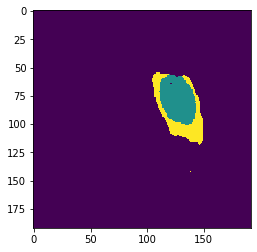

Actual:- 


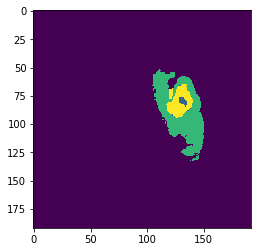

HGG test set no: 3 slice no: 452


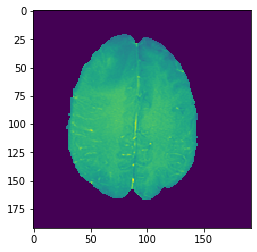

Predicted:- 


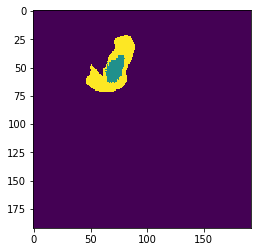

Actual:- 


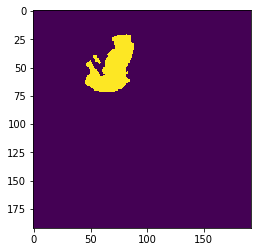

HGG test set no: 3 slice no: 453


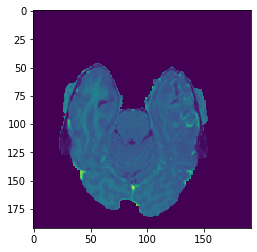

Predicted:- 


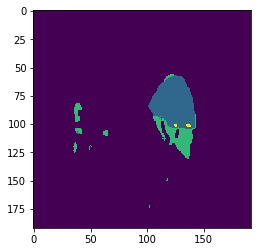

Actual:- 


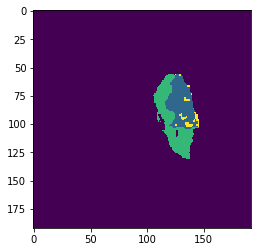

HGG test set no: 3 slice no: 454


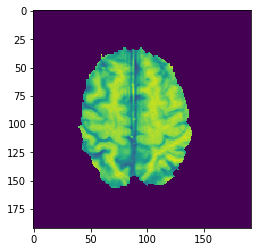

Predicted:- 


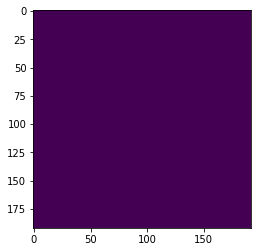

Actual:- 


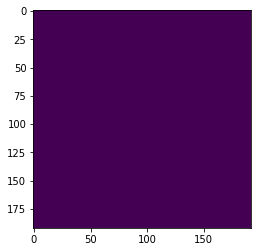

HGG test set no: 3 slice no: 455


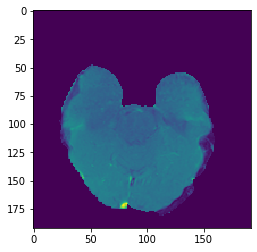

Predicted:- 


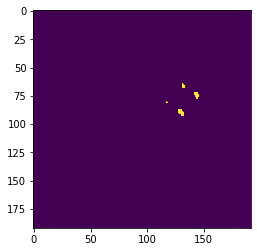

Actual:- 


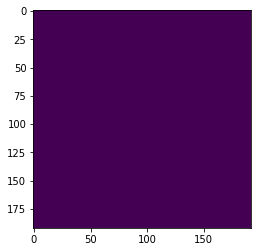

HGG test set no: 3 slice no: 456


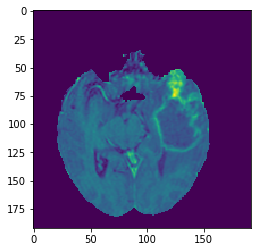

Predicted:- 


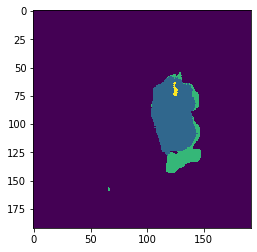

Actual:- 


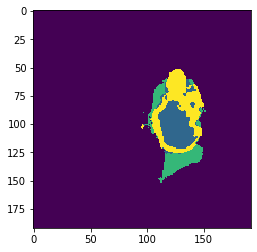

HGG test set no: 3 slice no: 457


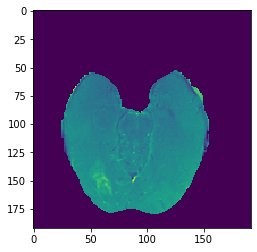

Predicted:- 


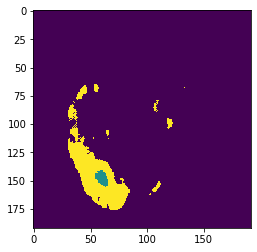

Actual:- 


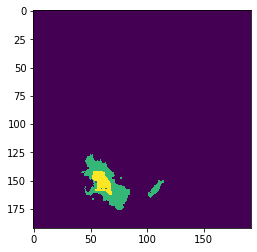

HGG test set no: 3 slice no: 458


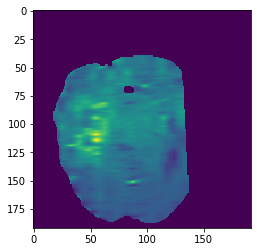

Predicted:- 


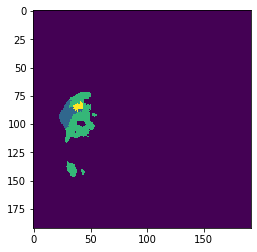

Actual:- 


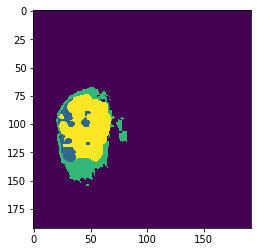

HGG test set no: 3 slice no: 459


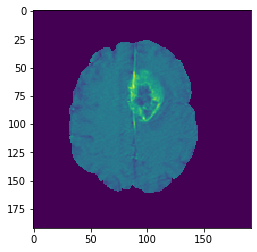

Predicted:- 


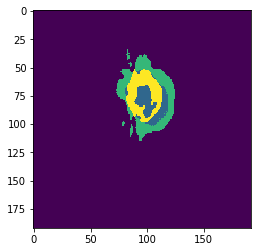

Actual:- 


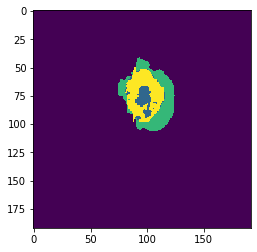

HGG test set no: 3 slice no: 460


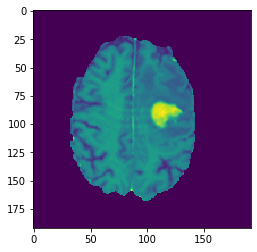

Predicted:- 


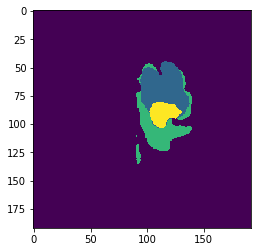

Actual:- 


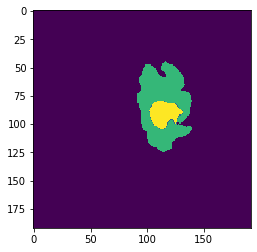

HGG test set no: 3 slice no: 461


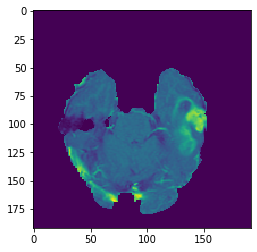

Predicted:- 


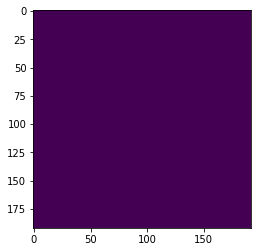

Actual:- 


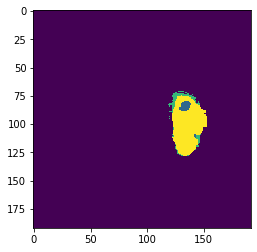

HGG test set no: 3 slice no: 462


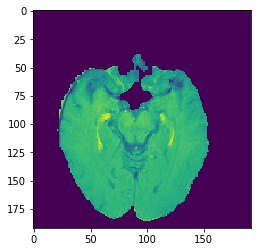

Predicted:- 


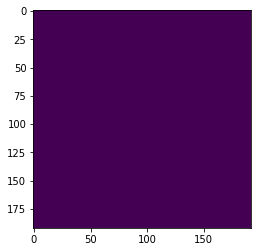

Actual:- 


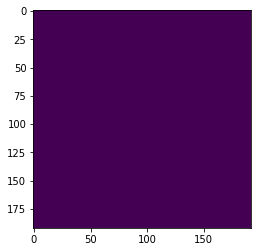

HGG test set no: 3 slice no: 463


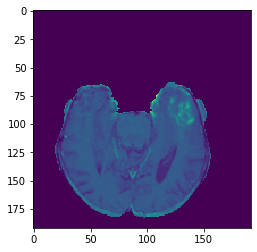

Predicted:- 


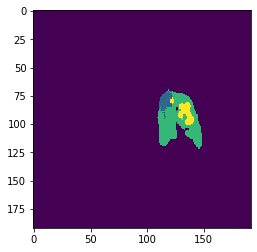

Actual:- 


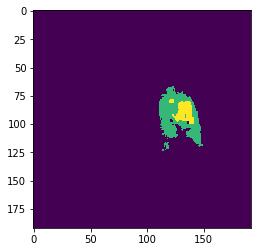

HGG test set no: 3 slice no: 464


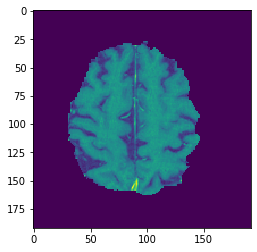

Predicted:- 


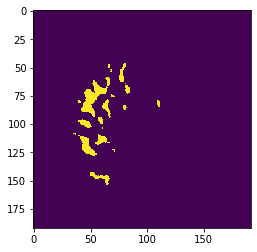

Actual:- 


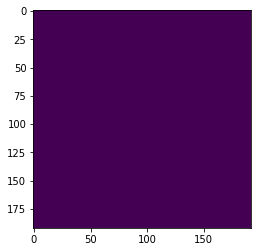

HGG test set no: 3 slice no: 465


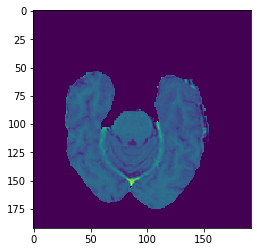

Predicted:- 


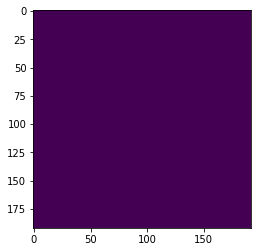

Actual:- 


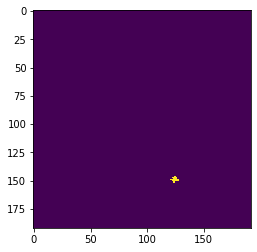

HGG test set no: 3 slice no: 466


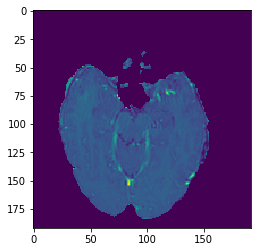

Predicted:- 


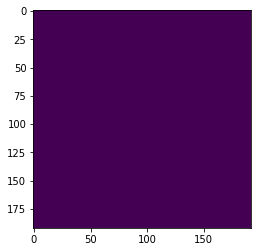

Actual:- 


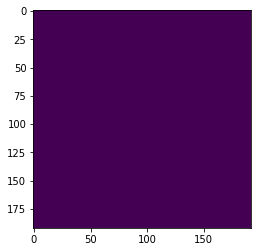

HGG test set no: 3 slice no: 467


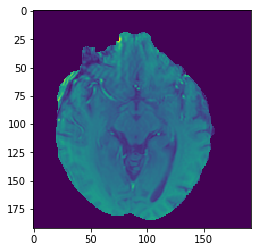

Predicted:- 


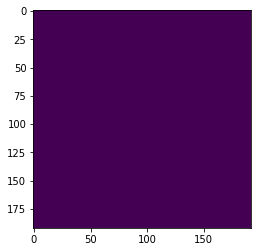

Actual:- 


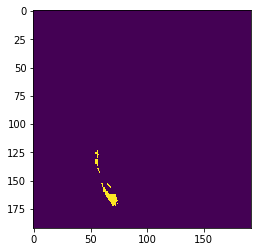

HGG test set no: 3 slice no: 468


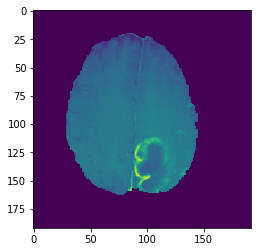

Predicted:- 


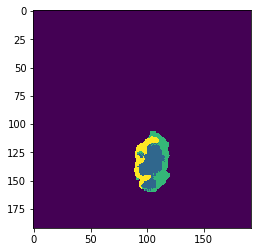

Actual:- 


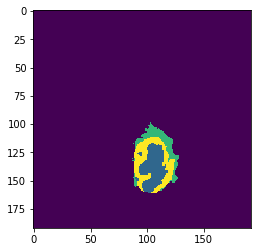

HGG test set no: 3 slice no: 469


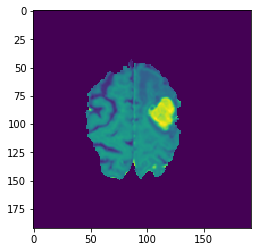

Predicted:- 


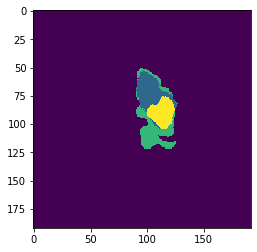

Actual:- 


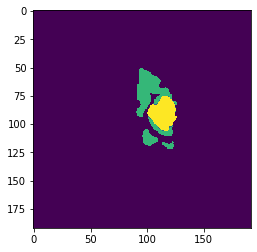

HGG test set no: 3 slice no: 470


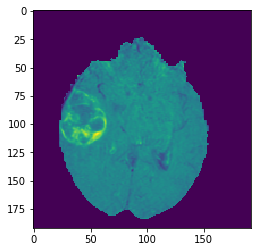

Predicted:- 


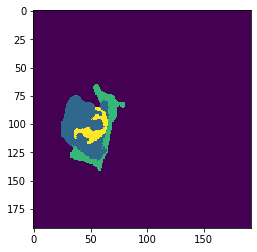

Actual:- 


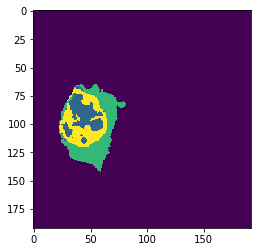

HGG test set no: 3 slice no: 471


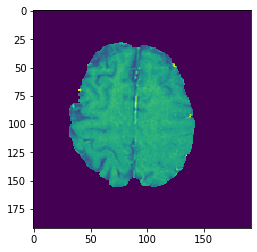

Predicted:- 


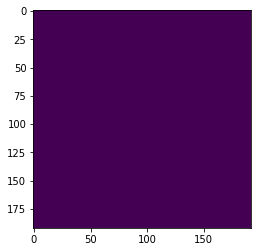

Actual:- 


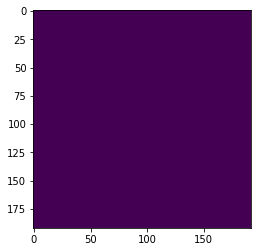

HGG test set no: 3 slice no: 472


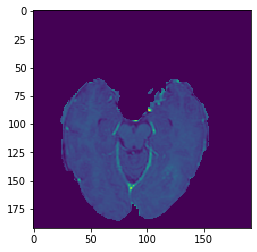

Predicted:- 


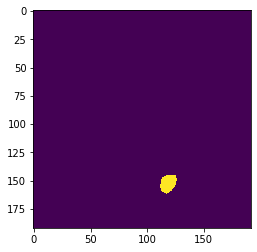

Actual:- 


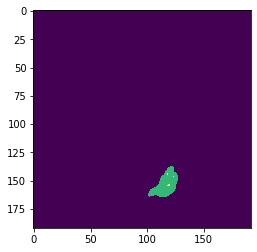

HGG test set no: 3 slice no: 473


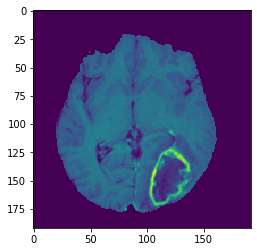

Predicted:- 


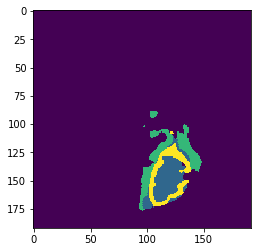

Actual:- 


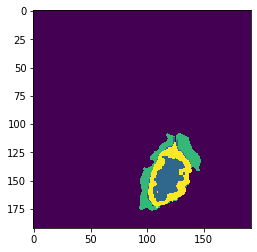

HGG test set no: 3 slice no: 474


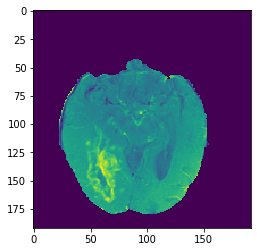

Predicted:- 


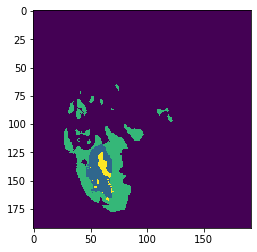

Actual:- 


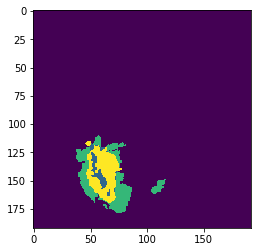

HGG test set no: 3 slice no: 475


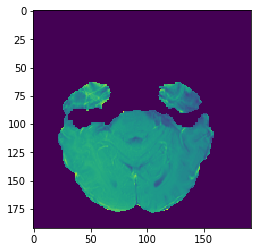

Predicted:- 


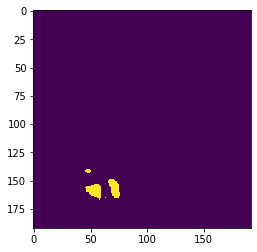

Actual:- 


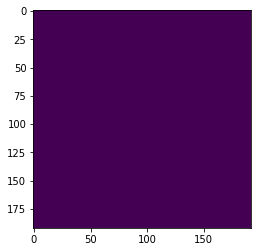

HGG test set no: 3 slice no: 476


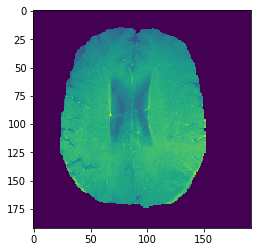

Predicted:- 


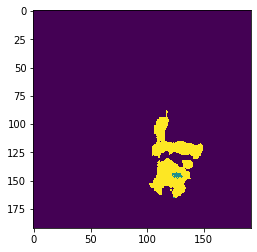

Actual:- 


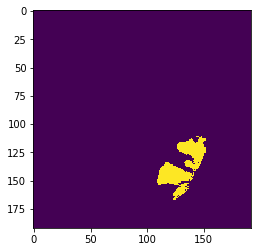

HGG test set no: 3 slice no: 477


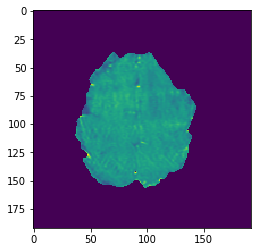

Predicted:- 


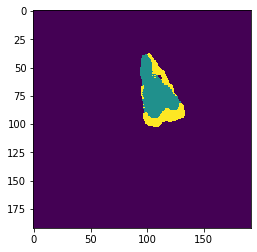

Actual:- 


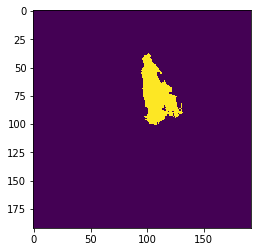

HGG test set no: 3 slice no: 478


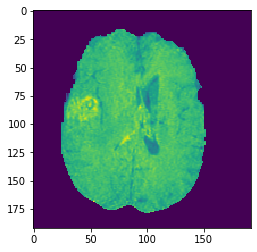

Predicted:- 


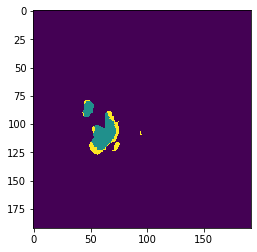

Actual:- 


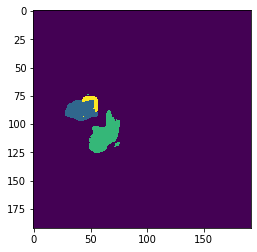

HGG test set no: 3 slice no: 479


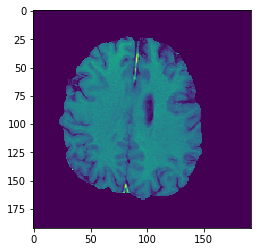

Predicted:- 


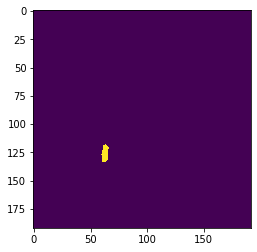

Actual:- 


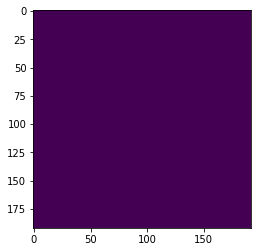

HGG test set no: 3 slice no: 480


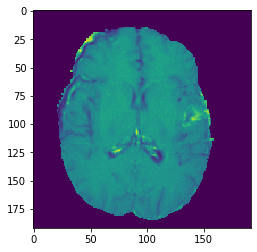

Predicted:- 


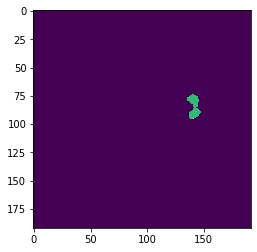

Actual:- 


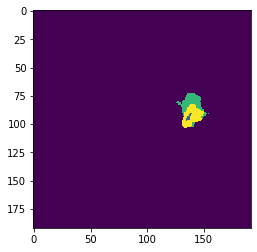

HGG test set no: 3 slice no: 481


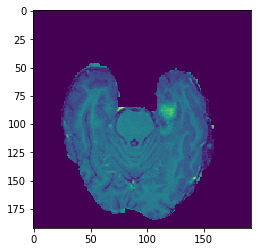

Predicted:- 


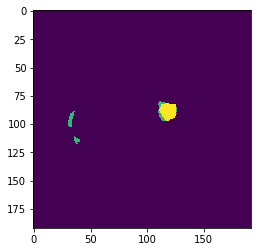

Actual:- 


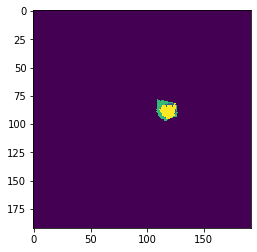

HGG test set no: 3 slice no: 482


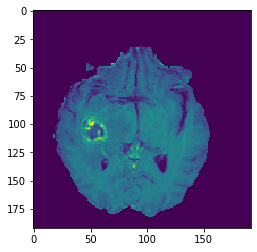

Predicted:- 


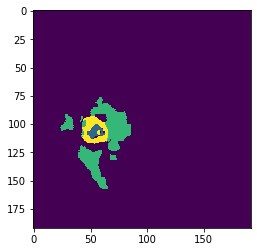

Actual:- 


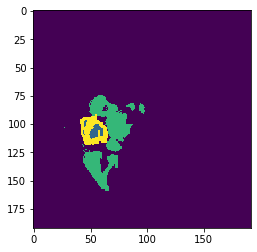

HGG test set no: 3 slice no: 483


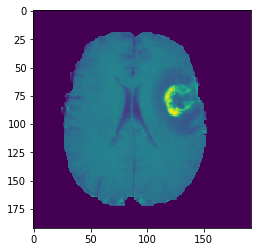

Predicted:- 


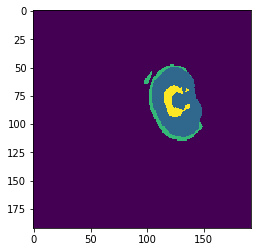

Actual:- 


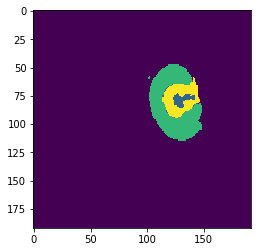

HGG test set no: 3 slice no: 484


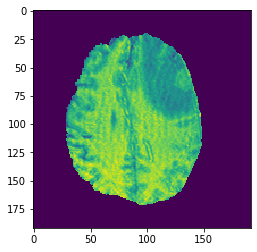

Predicted:- 


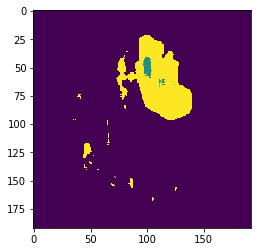

Actual:- 


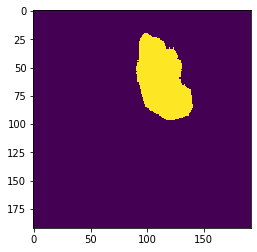

HGG test set no: 3 slice no: 485


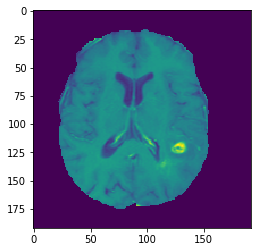

Predicted:- 


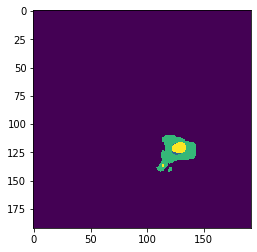

Actual:- 


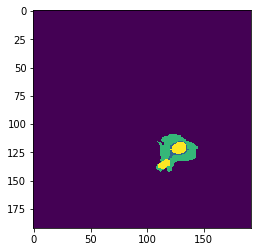

HGG test set no: 3 slice no: 486


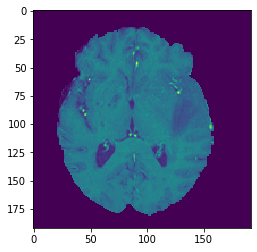

Predicted:- 


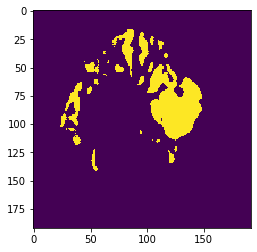

Actual:- 


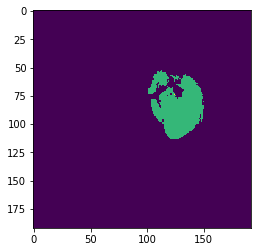

HGG test set no: 3 slice no: 487


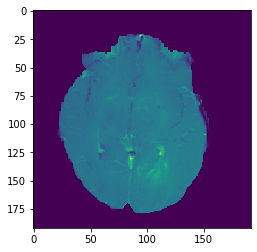

Predicted:- 


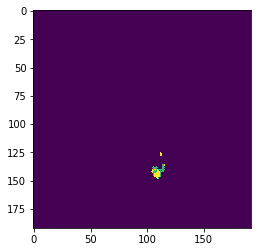

Actual:- 


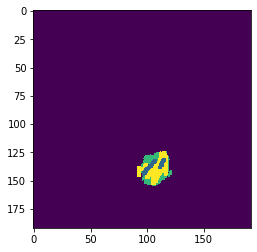

HGG test set no: 3 slice no: 488


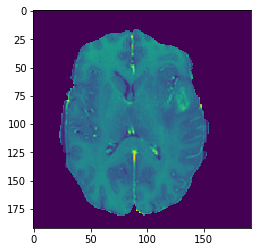

Predicted:- 


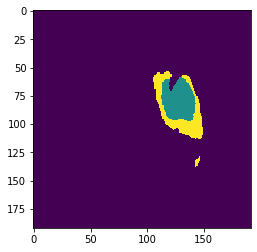

Actual:- 


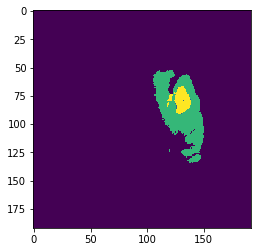

HGG test set no: 3 slice no: 489


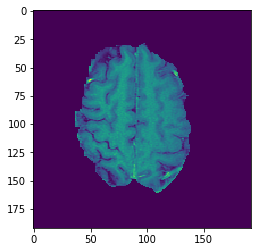

Predicted:- 


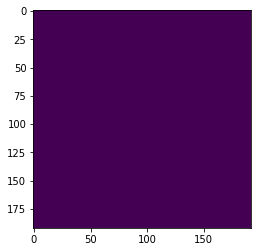

Actual:- 


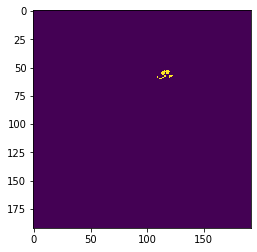

HGG test set no: 3 slice no: 490


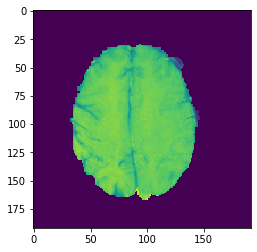

Predicted:- 


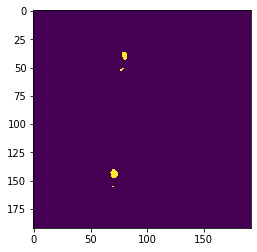

Actual:- 


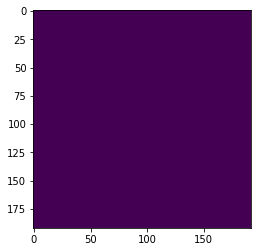

HGG test set no: 3 slice no: 491


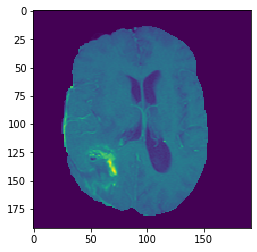

Predicted:- 


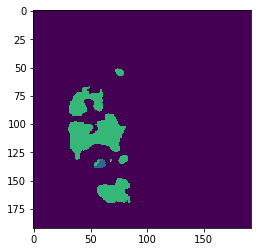

Actual:- 


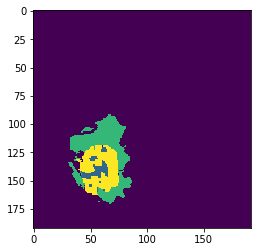

HGG test set no: 3 slice no: 492


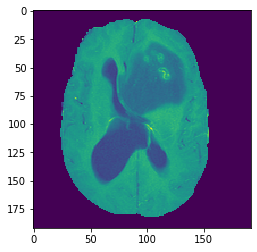

Predicted:- 


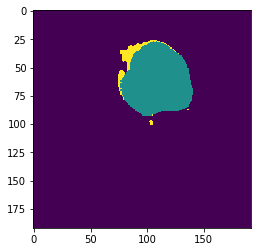

Actual:- 


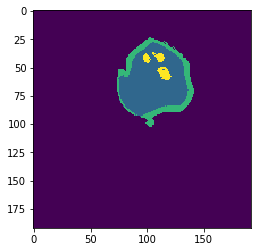

HGG test set no: 3 slice no: 493


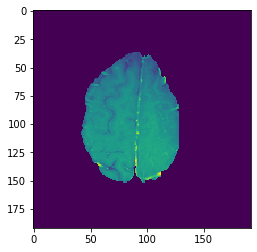

Predicted:- 


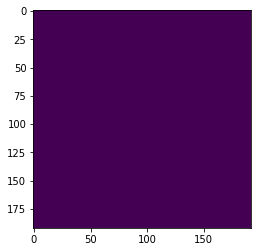

Actual:- 


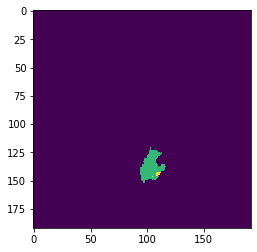

HGG test set no: 3 slice no: 494


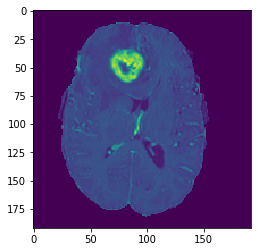

Predicted:- 


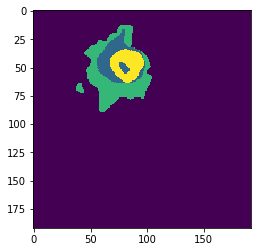

Actual:- 


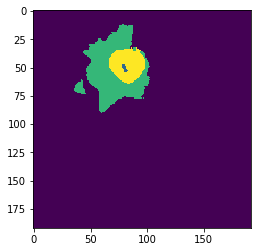

HGG test set no: 3 slice no: 495


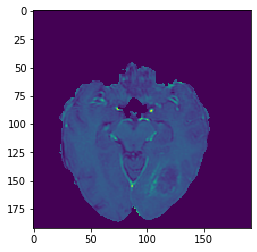

Predicted:- 


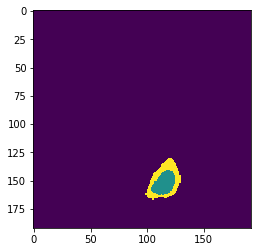

Actual:- 


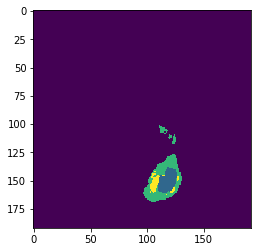

HGG test set no: 3 slice no: 496


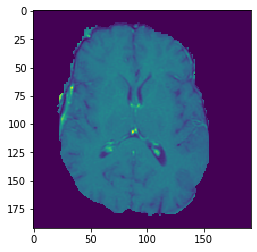

Predicted:- 


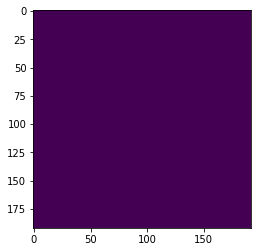

Actual:- 


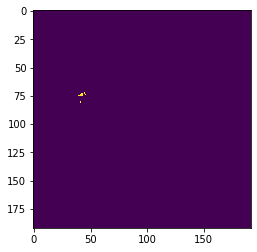

HGG test set no: 3 slice no: 497


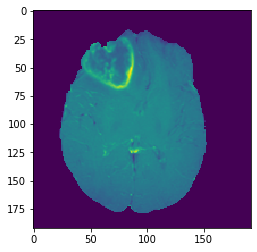

Predicted:- 


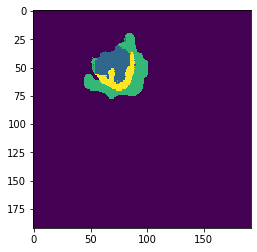

Actual:- 


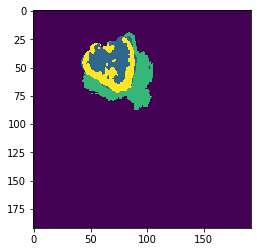

HGG test set no: 3 slice no: 498


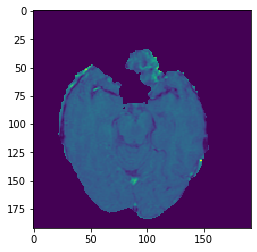

Predicted:- 


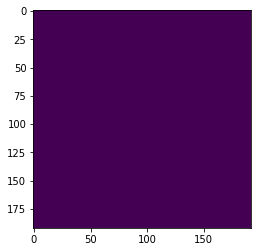

Actual:- 


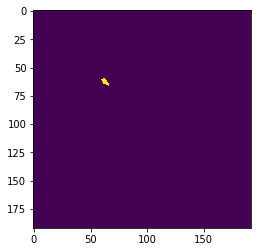

HGG test set no: 3 slice no: 499


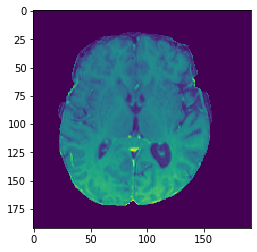

Predicted:- 


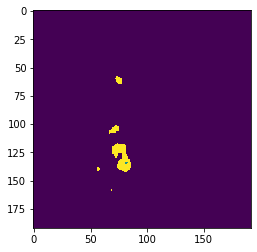

Actual:- 


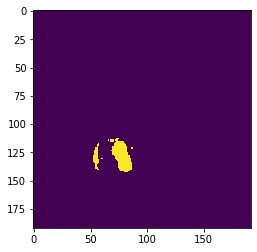

LGG test slice no: 450


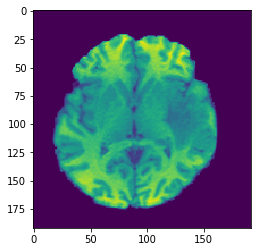

Predicted:- 


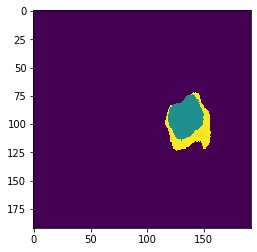

Actual:- 


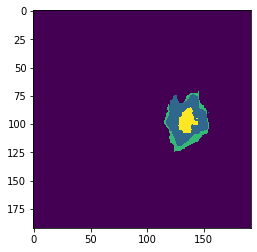

LGG test slice no: 451


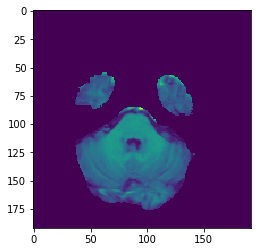

Predicted:- 


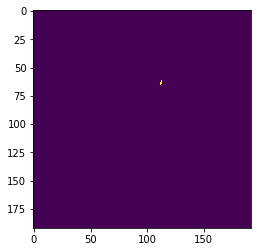

Actual:- 


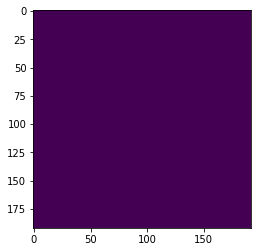

LGG test slice no: 452


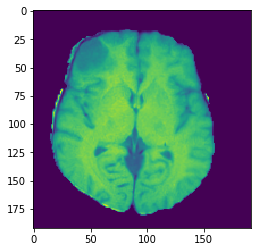

Predicted:- 


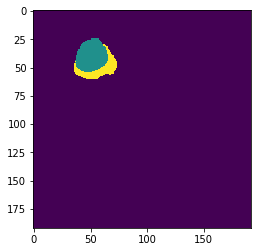

Actual:- 


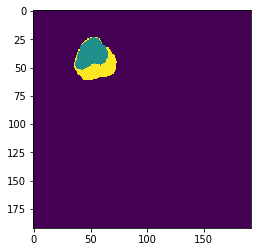

LGG test slice no: 453


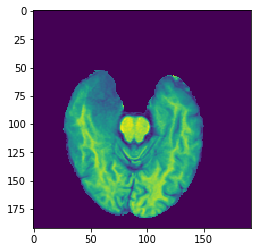

Predicted:- 


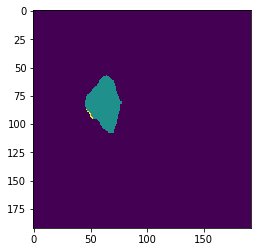

Actual:- 


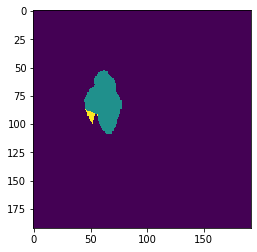

LGG test slice no: 454


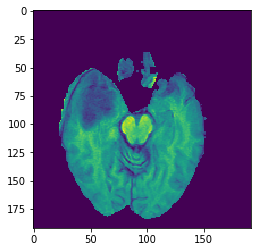

Predicted:- 


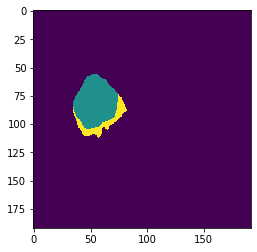

Actual:- 


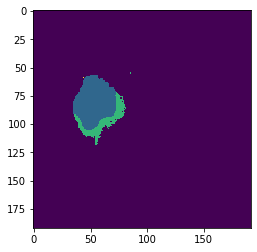

LGG test slice no: 455


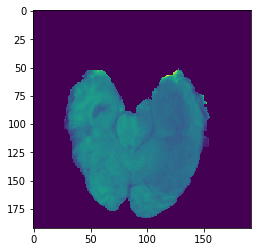

Predicted:- 


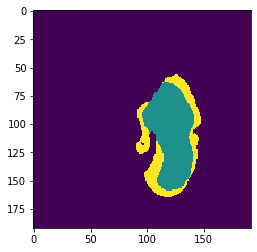

Actual:- 


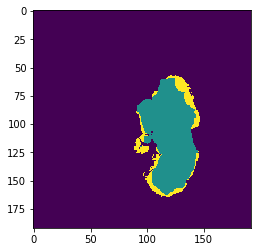

LGG test slice no: 456


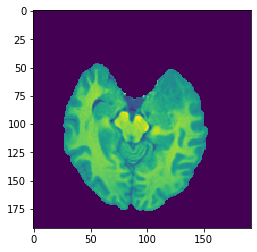

Predicted:- 


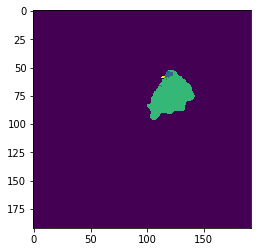

Actual:- 


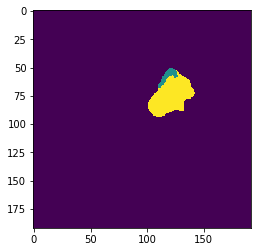

LGG test slice no: 457


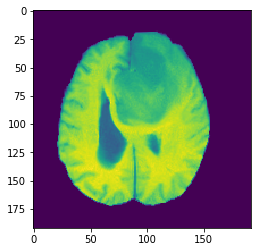

Predicted:- 


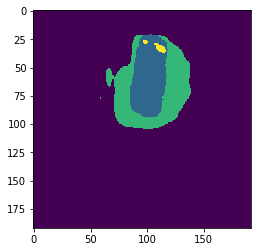

Actual:- 


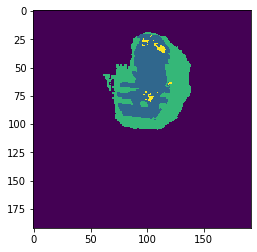

LGG test slice no: 458


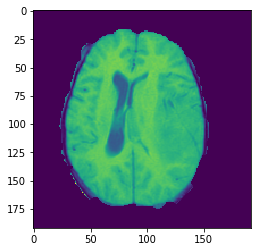

Predicted:- 


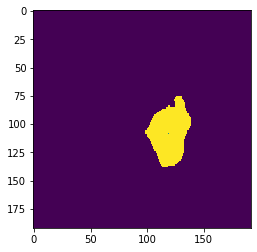

Actual:- 


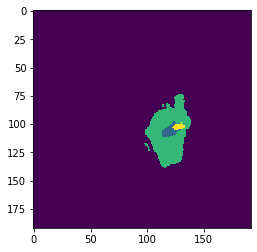

LGG test slice no: 459


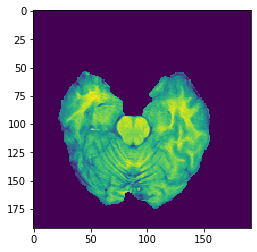

Predicted:- 


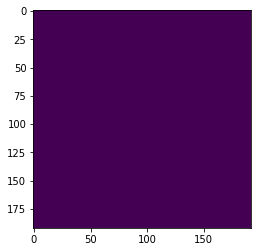

Actual:- 


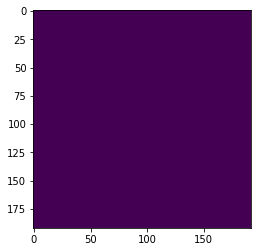

LGG test slice no: 460


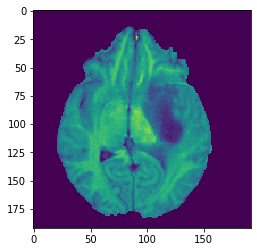

Predicted:- 


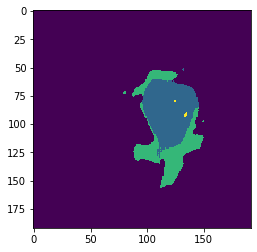

Actual:- 


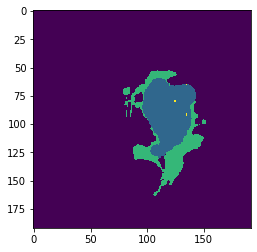

LGG test slice no: 461


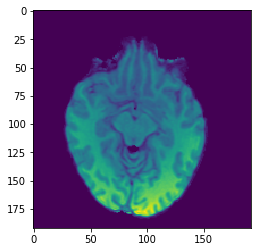

Predicted:- 


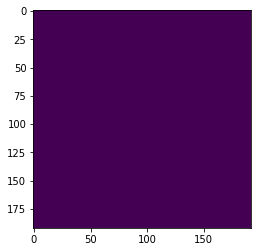

Actual:- 


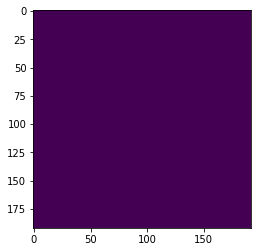

LGG test slice no: 462


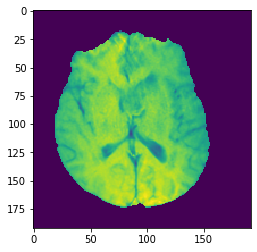

Predicted:- 


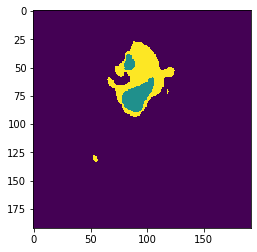

Actual:- 


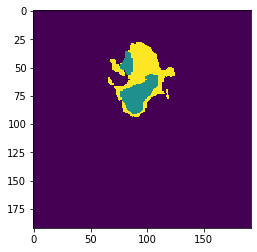

LGG test slice no: 463


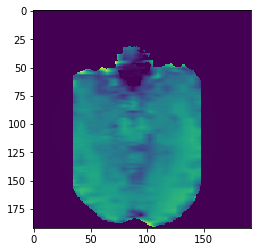

Predicted:- 


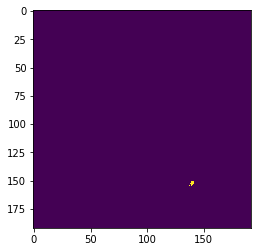

Actual:- 


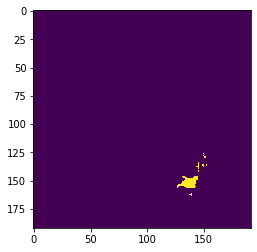

LGG test slice no: 464


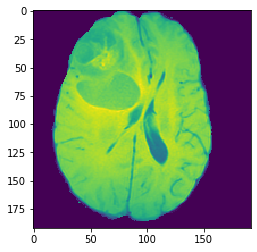

Predicted:- 


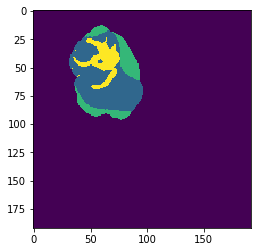

Actual:- 


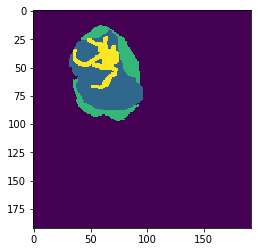

LGG test slice no: 465


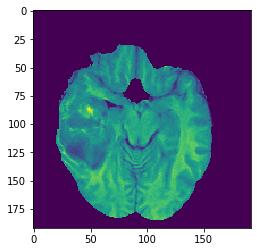

Predicted:- 


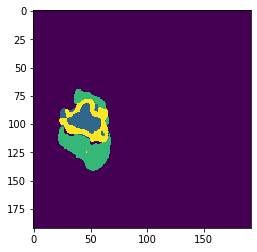

Actual:- 


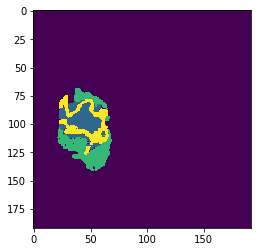

LGG test slice no: 466


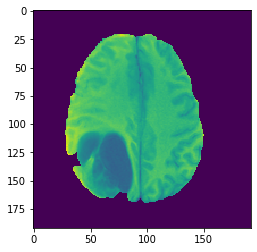

Predicted:- 


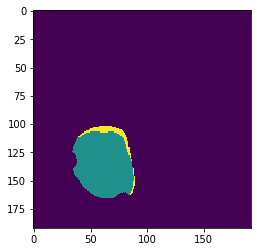

Actual:- 


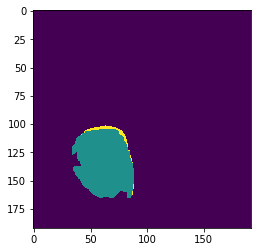

LGG test slice no: 467


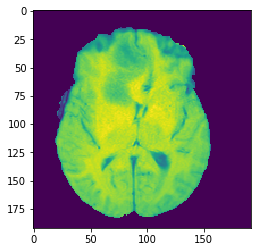

Predicted:- 


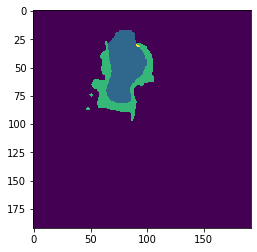

Actual:- 


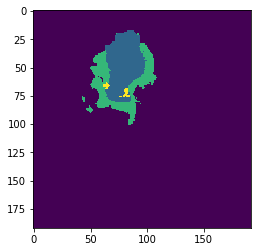

LGG test slice no: 468


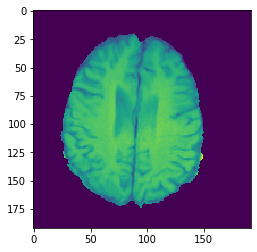

Predicted:- 


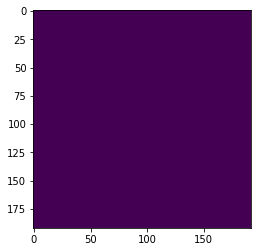

Actual:- 


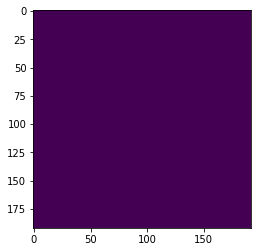

LGG test slice no: 469


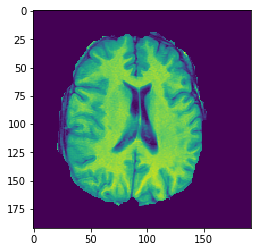

Predicted:- 


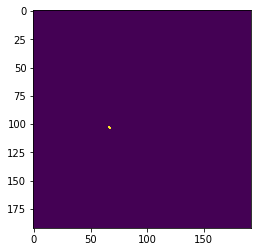

Actual:- 


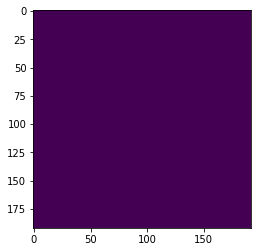

LGG test slice no: 470


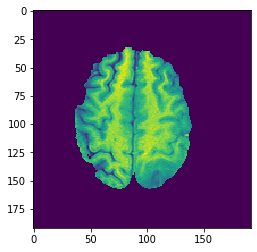

Predicted:- 


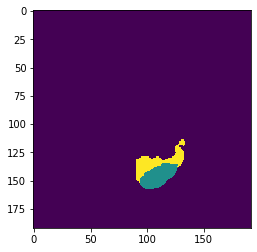

Actual:- 


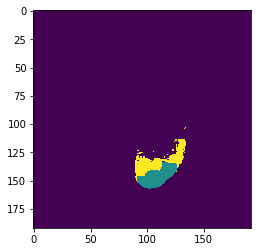

LGG test slice no: 471


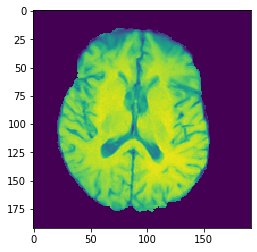

Predicted:- 


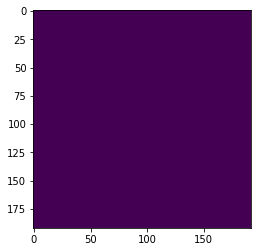

Actual:- 


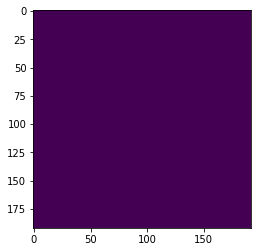

LGG test slice no: 472


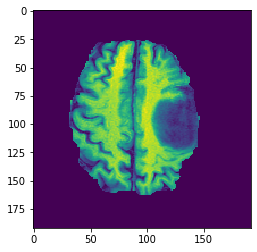

Predicted:- 


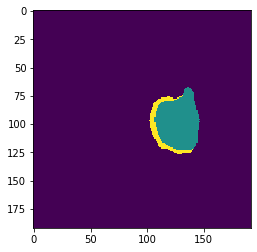

Actual:- 


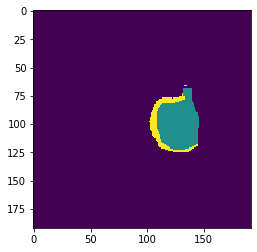

LGG test slice no: 473


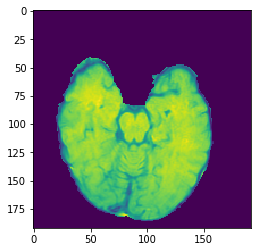

Predicted:- 


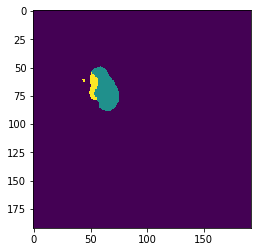

Actual:- 


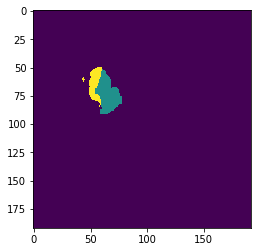

LGG test slice no: 474


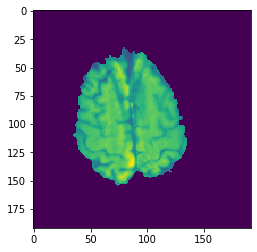

Predicted:- 


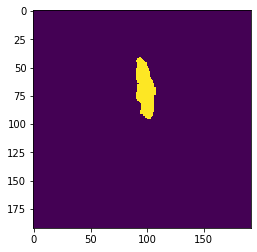

Actual:- 


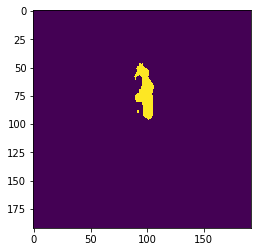

LGG test slice no: 475


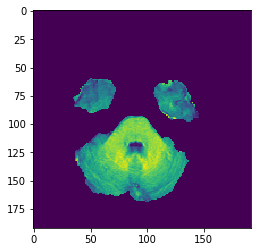

Predicted:- 


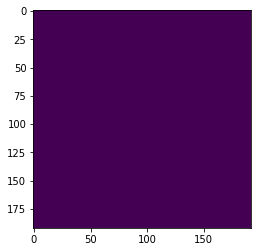

Actual:- 


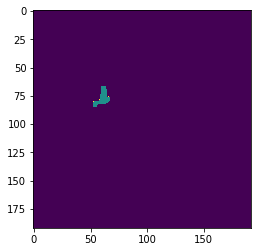

LGG test slice no: 476


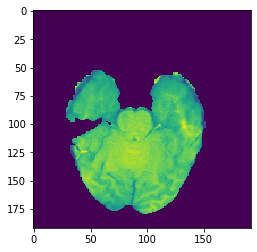

Predicted:- 


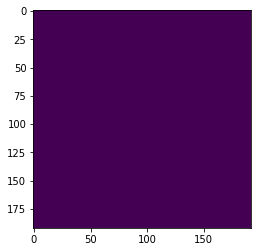

Actual:- 


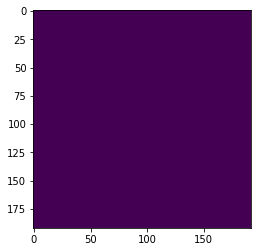

LGG test slice no: 477


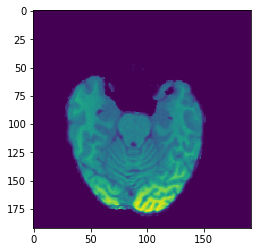

Predicted:- 


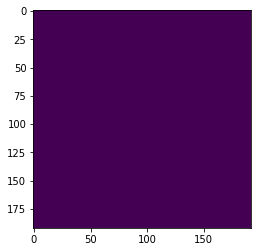

Actual:- 


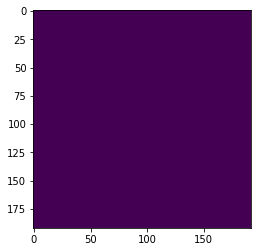

LGG test slice no: 478


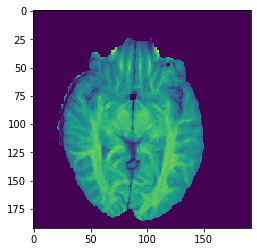

Predicted:- 


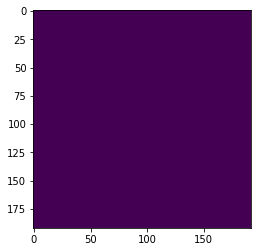

Actual:- 


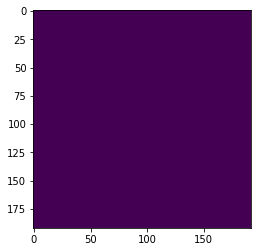

LGG test slice no: 479


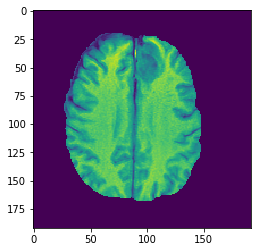

Predicted:- 


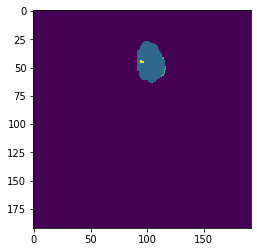

Actual:- 


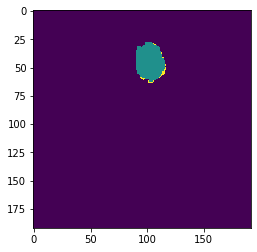

LGG test slice no: 480


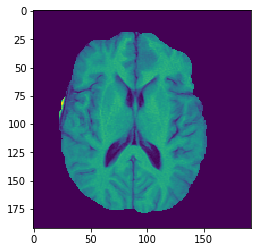

Predicted:- 


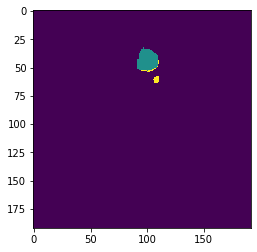

Actual:- 


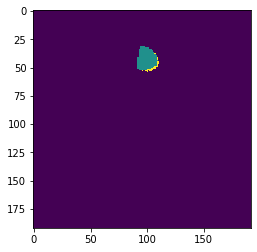

LGG test slice no: 481


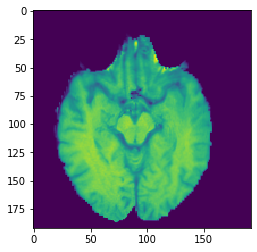

Predicted:- 


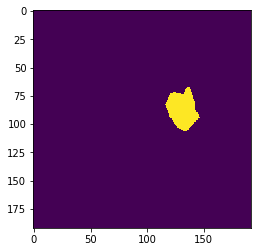

Actual:- 


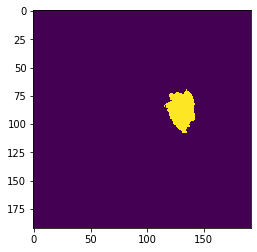

LGG test slice no: 482


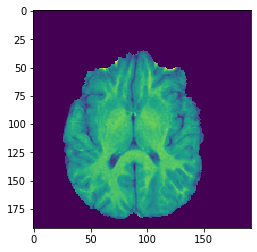

Predicted:- 


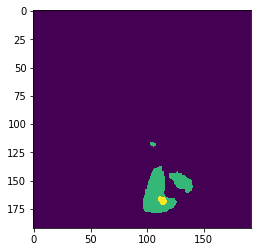

Actual:- 


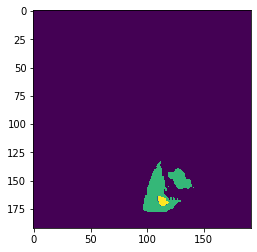

LGG test slice no: 483


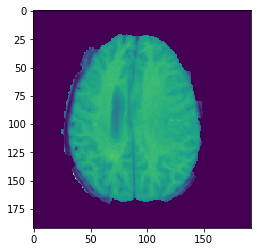

Predicted:- 


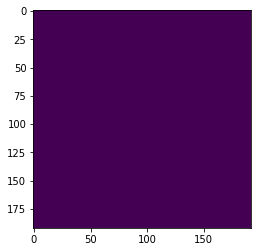

Actual:- 


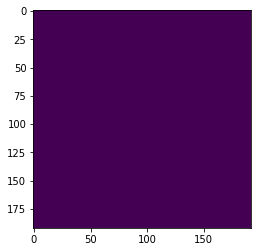

LGG test slice no: 484


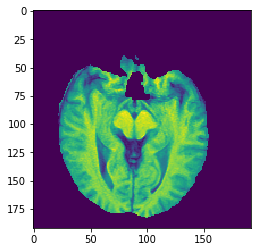

Predicted:- 


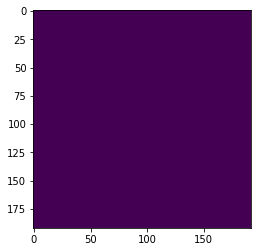

Actual:- 


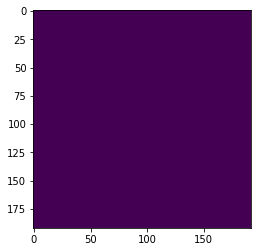

LGG test slice no: 485


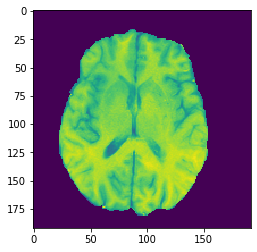

Predicted:- 


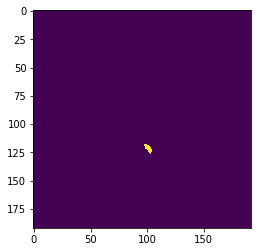

Actual:- 


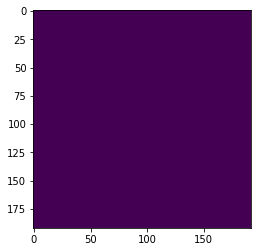

LGG test slice no: 486


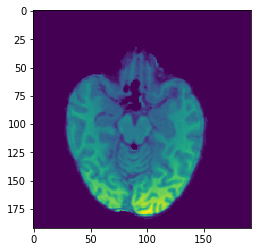

Predicted:- 


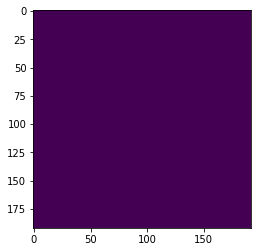

Actual:- 


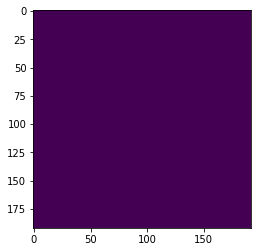

LGG test slice no: 487


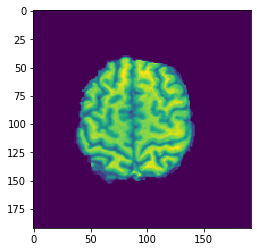

Predicted:- 


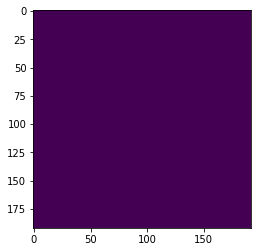

Actual:- 


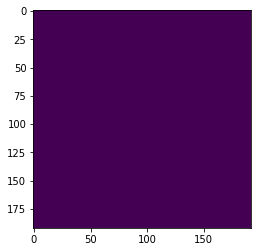

LGG test slice no: 488


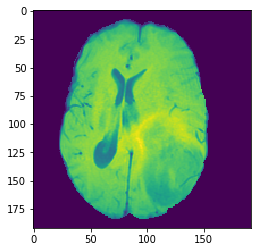

Predicted:- 


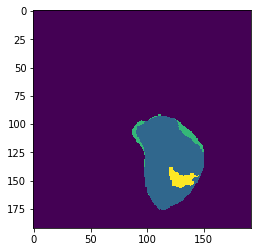

Actual:- 


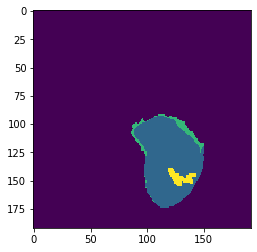

LGG test slice no: 489


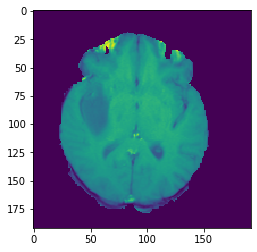

Predicted:- 


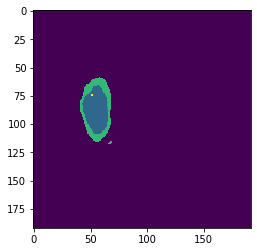

Actual:- 


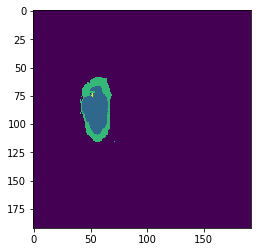

LGG test slice no: 490


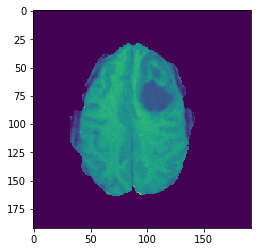

Predicted:- 


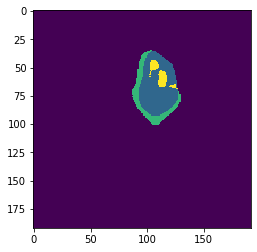

Actual:- 


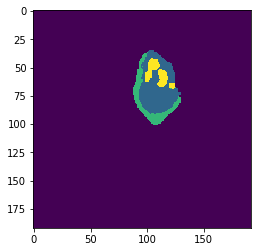

LGG test slice no: 491


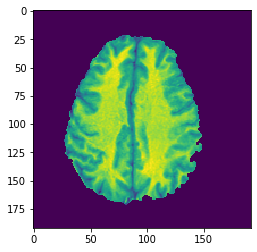

Predicted:- 


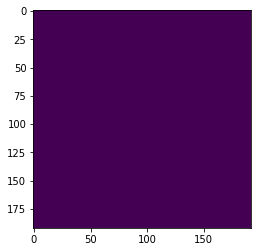

Actual:- 


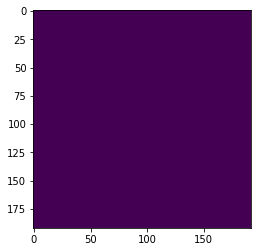

LGG test slice no: 492


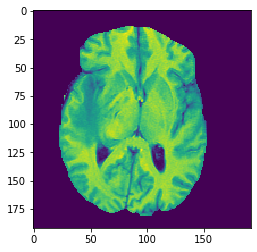

Predicted:- 


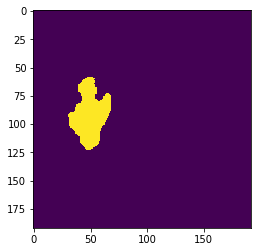

Actual:- 


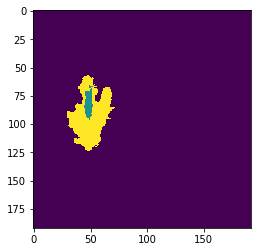

LGG test slice no: 493


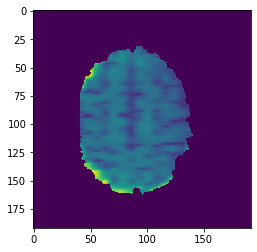

Predicted:- 


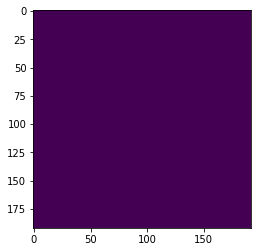

Actual:- 


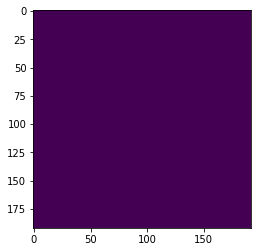

LGG test slice no: 494


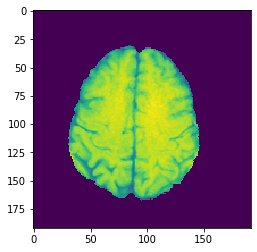

Predicted:- 


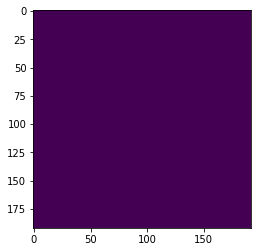

Actual:- 


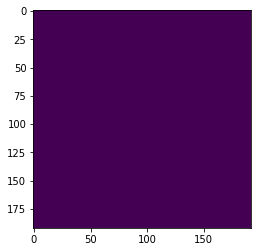

LGG test slice no: 495


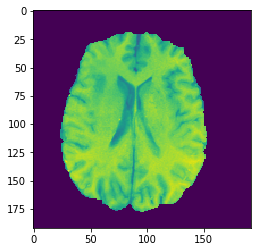

Predicted:- 


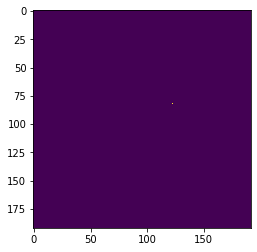

Actual:- 


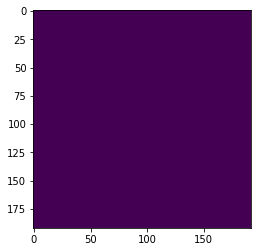

LGG test slice no: 496


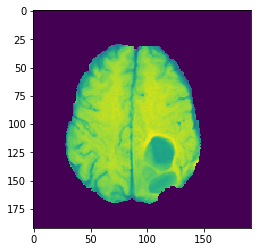

Predicted:- 


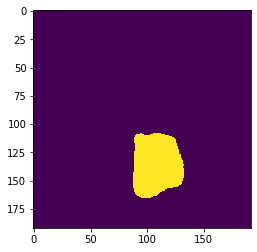

Actual:- 


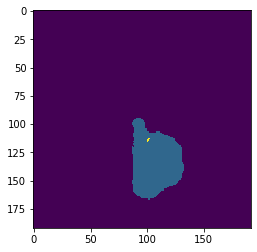

LGG test slice no: 497


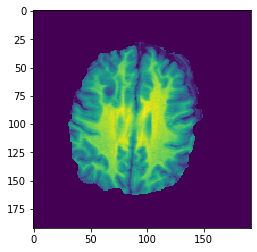

Predicted:- 


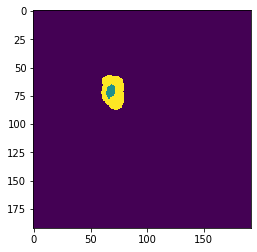

Actual:- 


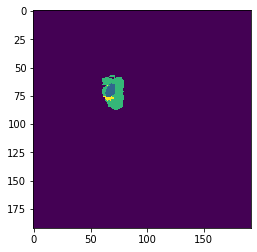

LGG test slice no: 498


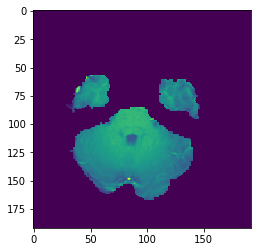

Predicted:- 


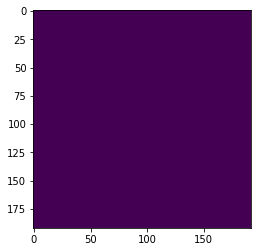

Actual:- 


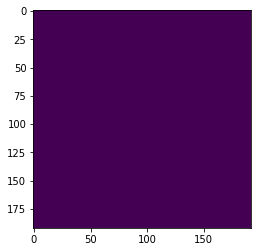

LGG test slice no: 499


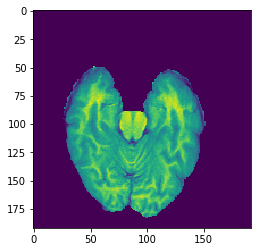

Predicted:- 


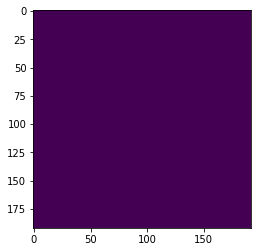

Actual:- 


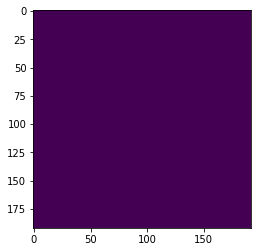

In [14]:
import matplotlib.pyplot as plt
for i in range(450,500):
  print('HGG test set no: 1 '+ 'slice no: ' + str(i))
  plt.imshow(X_test1[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred1[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test1[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 2 '+ 'slice no: ' + str(i))
  plt.imshow(X_test2[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred2[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test2[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 3 '+ 'slice no: ' + str(i))
  plt.imshow(X_test3[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred3[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test3[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('LGG test slice no: ' + str(i))
  plt.imshow(X_test4[i,:,:,1])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred4[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test4[i,:,:,0])
  plt.show()